# SETUP

## Check environment

In [1]:
USE_GPU = True

In [2]:
try:
    import google.colab
    COLAB = True
except:
    COLAB = False
print(f"Using Google Colab: {COLAB}")

Using Google Colab: False


In [3]:
!pip install --upgrade pip tensorflow keras jupyterlab-vim jupyterlab-indent-guides maap-user-workspace-management-jupyter-extension pydot
!apt-get install graphviz -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
The following packages were automatically installed and are no longer required:
  gyp javascript-common libauthen-sasl-perl libc-ares2 libclone-perl
  libdata-dump-perl libencode-locale-perl libfile-basedir-perl
  libfile-desktopentry-perl libfile-listing-perl libfile-mimeinfo-perl
  libfont-afm-perl libfontenc1 libgtkd-3-0 libhtml-form-perl
  libhtml-format-perl libhtml-parser-perl libhtml-tagset-perl
  libhtml-tree-perl libhttp-cookies-perl libhttp-daemon-perl libhttp-date-perl
  libhttp-message-perl libhttp-negotiate-perl libio-html-perl
  libio-socket-ssl-perl libio-stringy-perl libipc-system-simple-perl
  libjs-events libjs-highlight.js libjs-inherits libjs-is-typedarray libjs-psl
  libjs-source-map libjs-sprintf-js libjs-typedarray-to-buffer libllvm11
  liblwp-mediatypes-perl liblwp-protocol-https-perl libmailtools-perl
  lib

## Libraries

In [4]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K

# Append the custom libraries to system path
if COLAB:
    sys.path.append("/content/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_prediction
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData, augmentReducedData
from src.data_utils import mice

# Configuration reader
from src.config_reader import ConfigurationReader

# Checking Tensorflow
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

Using GPU to train
2.20.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


## Configuration

In [5]:
if COLAB:
    confReader = ConfigurationReader("/content/air_quality_index_project/model_params_colab.json")
else:
    confReader = ConfigurationReader("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/model_params.json")
print(confReader)

conf = confReader.data

# Clear all temp folders
def cleanDir(input_dir):
    if os.path.exists(input_dir):
        shutil.rmtree(input_dir)
    os.makedirs(input_dir)

cleanDir(conf["workspace"]["model_info_dir"])
cleanDir(conf["workspace"]["model_checkpoints_dir"])
cleanDir(conf["workspace"]["data_statistic_dir"])
cleanDir(conf["workspace"]["data_by_station_dir"])
cleanDir(conf["workspace"]["data_by_location_dir"])
cleanDir(conf["workspace"]["best_reduction_models_dir"])
cleanDir(conf["workspace"]["best_reduced_data"])

{
    "dataset": {
        "aod2022": {
            "file_dir": "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/MatchingData2022.xlsx",
            "target_start_date": "2022-01-01",
            "target_end_date": "2022-12-31"
        },
        "aod2021": {
            "file_dir": "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/aod_data_daily.csv",
            "target_start_date": "2021-01-01",
            "target_end_date": "2021-12-31"
        },
        "mpair": {
            "file_dir": "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/MPair.csv",
            "target_start_date": "2021-01-01",
            "target_end_date": "2022-12-31",
            "station_2022_dir": "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/station2022.csv",
            "station_2018_2021_dir": "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/station2018-2021.c

# AOD DATA

## Load 2022 dataset

In [6]:
df_aod_raw_2022 = pd.read_excel(conf["dataset"]["aod2022"]["file_dir"])

print(df_aod_raw_2022.columns)
df_aod_raw_2022

Index(['time', 'ID', 'pm25', 'lat', 'lon', 'PM25_3km', 'TMP', 'RH', 'HPBL',
       'WSPD', 'PRES2M', 'AOD', 'OID', 'POP', 'ROAD_DEN_1km',
       'PRIM_ROAD_LEN_1km', 'NEAR_DIST', 'BARELAND', 'BUILTUP', 'CROPLAND',
       'GRASSLAND', 'TREECOVER', 'WATER', 'NDVI', 'Name'],
      dtype='object')


,time,ID,pm25,lat,lon,PM25_3km,TMP,RH,HPBL,WSPD,...,PRIM_ROAD_LEN_1km,NEAR_DIST,BARELAND,BUILTUP,CROPLAND,GRASSLAND,TREECOVER,WATER,NDVI,Name
0,2022-01-01,S4,23.768238,10.815839,106.717396,22.025597,28.261583,57.233841,721.996887,2.003031,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
1,2022-01-01,S5,14.221014,10.776415,106.687955,22.705284,27.787918,61.073841,659.863586,1.885687,...,7249.776367,21.703104,395.082094,877872.4121,0.00000,98.770523,121487.74380,0.00000,1721.431568,Tòa soạn Báo Thanh Niên - Nguyễn Đình Chiểu - Q3
2,2022-01-01,S6,21.405015,10.780482,106.659511,23.503082,27.787918,61.073841,659.863586,1.885687,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"
3,2022-01-01,S7,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924,ĐSQ Mỹ
4,2022-01-02,S4,22.154723,10.815839,106.717396,22.711113,25.827082,57.916595,619.779785,1.286289,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,2022-12-30,S6,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"
994,2022-12-30,S7,40.166667,10.783456,106.700622,19.137615,24.979719,64.868401,680.533081,3.893373,...,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924,ĐSQ Mỹ
995,2022-12-31,S4,27.879261,10.815839,106.717396,28.223820,26.630608,55.437901,607.372803,4.217750,...,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q.Bìn..."
996,2022-12-31,S6,28.854069,10.780482,106.659511,27.658358,25.364861,62.377899,799.122803,4.161542,...,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348,"MobiFone Thành Thái, Q10"


In [7]:
# Convert "time" columns to Pandas datetime
df_aod_raw_2022 = df_aod_raw_2022.assign(time=pd.to_datetime(df_aod_raw_2022["time"]))

# Set "time" column as index
#df_aod_raw_2022.set_index("time", inplace=True)

# Lower case all column names
df_aod_raw_2022 = df_aod_raw_2022.rename(columns={name: name.lower() for name in df_aod_raw_2022.columns})

# Rename oid to station
df_aod_raw_2022 = df_aod_raw_2022.rename(columns={"oid": "station"})

# Drop unnecessary columns
df_aod_raw_2022.drop(columns=["name", "id"], axis=1, inplace=True)

# Print
df_aod_raw_2022

,time,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,pres2m,...,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi
0,2022-01-01,23.768238,10.815839,106.717396,22.025597,28.261583,57.233841,721.996887,2.003031,101227.000000,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
1,2022-01-01,14.221014,10.776415,106.687955,22.705284,27.787918,61.073841,659.863586,1.885687,101204.875000,...,23.362053,7249.776367,21.703104,395.082094,877872.4121,0.00000,98.770523,121487.74380,0.00000,1721.431568
2,2022-01-01,21.405015,10.780482,106.659511,23.503082,27.787918,61.073841,659.863586,1.885687,101204.875000,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348
3,2022-01-01,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,101204.875000,...,27.462461,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924
4,2022-01-02,22.154723,10.815839,106.717396,22.711113,25.827082,57.916595,619.779785,1.286289,101201.015625,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,2022-12-30,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,101393.398438,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348
994,2022-12-30,40.166667,10.783456,106.700622,19.137615,24.979719,64.868401,680.533081,3.893373,101393.398438,...,27.462461,6885.987305,18.537305,296.311570,764977.7039,0.00000,1876.639945,232011.95950,0.00000,2700.122924
995,2022-12-31,27.879261,10.815839,106.717396,28.223820,26.630608,55.437901,607.372803,4.217750,101322.437500,...,22.923040,2327.256348,2.546965,1876.639945,841524.8595,296.31157,3753.279890,91461.50468,61731.57713,1818.661486
996,2022-12-31,28.854069,10.780482,106.659511,27.658358,25.364861,62.377899,799.122803,4.161542,101297.140625,...,33.629780,2345.868408,6.057246,10370.904960,885181.4309,0.00000,8099.182920,95807.40771,0.00000,1879.344348


In [8]:
df_aod_raw_2022["station"].unique()

array([214, 215, 216, 201])

## Load 2021 dataset

In [9]:
df_aod_raw_2021 = pd.read_csv(conf["dataset"]["aod2021"]["file_dir"])

print(df_aod_raw_2021.columns)
df_aod_raw_2021

Index(['time', 'ID', 'pm25', 'Lat', 'Lon', 'PM25_3km', 'TMP', 'RH', 'HPBL',
       'WSPD', 'POP', 'ROAD_DEN_1km', 'PRIM_ROAD_LEN_1km', 'NEAR_DIST',
       'BARELAND', 'BUILTUP', 'CROPLAND', 'GRASSLAND', 'TREECOVER', 'WATER',
       'NDVI', 'AOD'],
      dtype='object')


,time,ID,pm25,Lat,Lon,PM25_3km,TMP,RH,HPBL,WSPD,...,PRIM_ROAD_LEN_1km,NEAR_DIST,BARELAND,BUILTUP,CROPLAND,GRASSLAND,TREECOVER,WATER,NDVI,AOD
0,1/1/2018,201,31.391304,10.783057,106.700606,34.919998,25.204139,70.056728,455.131335,2.352895,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1,1/1/2018,202,29.615625,10.762638,106.682027,32.099998,25.100436,71.060891,457.243423,2.344162,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,NaN
2,1/2/2018,201,37.458333,10.783057,106.700606,51.830002,24.726431,73.425826,339.083720,1.903761,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.110117
3,1/2/2018,202,36.244792,10.762638,106.682027,44.619999,24.663358,73.870799,338.530190,1.885305,...,7097.612305,3.822386,395.082094,947604.4016,0.000000,2963.115702,13926.64380,35063.535810,1765.098553,1.277641
4,1/3/2018,201,68.083333,10.783057,106.700606,38.240002,26.095087,77.793432,367.190738,1.293329,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,1.439045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,12/31/2021,211,14.474306,10.870190,106.796200,17.930000,23.428631,75.209297,134.323181,1.485907,...,0.000000,49.023548,1086.475758,724185.4777,592.623140,46915.998620,225888.18710,0.000000,3579.160484,NaN
2887,12/31/2021,212,20.100752,10.740760,106.617000,20.010000,24.914532,64.741638,212.347687,2.196620,...,2529.119629,20.331284,16297.136360,892984.3022,7506.559780,26470.500280,57681.98567,0.000000,3266.283480,NaN
2888,12/31/2021,213,23.240539,10.816350,106.620500,20.700001,24.171986,67.759666,145.481979,2.459679,...,0.000000,7.560823,13136.479610,928245.3791,4247.132507,17581.153170,34964.76529,1481.557851,2535.126792,0.272610
2889,12/31/2021,214,20.549839,10.815570,106.717500,21.040001,24.367620,67.038559,168.648315,2.101351,...,2327.256348,2.546965,1876.639945,841524.8595,296.311570,3753.279890,91461.50468,61731.577130,1818.661486,0.524898


In [10]:
# Convert "time" columns to Pandas datetime
df_aod_raw_2021['time'] = pd.to_datetime(df_aod_raw_2021['time'])

# Set "time" column as index
#df_aod_raw_2021.set_index("time", inplace=True)

# Lower case all column names
df_aod_raw_2021.rename(columns={name: name.lower() for name in df_aod_raw_2021.columns}, inplace=True)

# Rename "id" to "station"
df_aod_raw_2021.rename(columns={'id':'station'}, inplace=True)

# Only get data in 2021
time_mask = ((df_aod_raw_2021["time"] >= conf["dataset"]["aod2021"]["target_start_date"]) & (df_aod_raw_2021["time"] <= conf["dataset"]["aod2021"]["target_end_date"]))
df_aod_raw_2021 = df_aod_raw_2021.loc[time_mask]

# Print
df_aod_raw_2021

,time,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
1316,2021-01-01,201,17.250000,10.783057,106.700606,38.320000,25.873598,60.583508,561.605774,3.548874,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1317,2021-01-02,201,23.000000,10.783057,106.700606,56.650002,25.527328,60.219109,527.248901,2.355864,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1318,2021-01-03,201,28.291667,10.783057,106.700606,56.900002,26.878422,61.481564,469.774841,1.896463,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1319,2021-01-04,201,28.791667,10.783057,106.700606,61.560001,27.771753,61.013718,615.690735,1.642178,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
1320,2021-01-05,201,24.833333,10.783057,106.700606,69.949997,27.660774,61.277409,665.619263,2.859253,...,6885.987305,18.537305,296.311570,764977.7039,0.000000,1876.639945,232011.95950,0.000000,2700.122924,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,2021-12-31,211,14.474306,10.870190,106.796200,17.930000,23.428631,75.209297,134.323181,1.485907,...,0.000000,49.023548,1086.475758,724185.4777,592.623140,46915.998620,225888.18710,0.000000,3579.160484,NaN
2887,2021-12-31,212,20.100752,10.740760,106.617000,20.010000,24.914532,64.741638,212.347687,2.196620,...,2529.119629,20.331284,16297.136360,892984.3022,7506.559780,26470.500280,57681.98567,0.000000,3266.283480,NaN
2888,2021-12-31,213,23.240539,10.816350,106.620500,20.700001,24.171986,67.759666,145.481979,2.459679,...,0.000000,7.560823,13136.479610,928245.3791,4247.132507,17581.153170,34964.76529,1481.557851,2535.126792,0.272610
2889,2021-12-31,214,20.549839,10.815570,106.717500,21.040001,24.367620,67.038559,168.648315,2.101351,...,2327.256348,2.546965,1876.639945,841524.8595,296.311570,3753.279890,91461.50468,61731.577130,1818.661486,0.524898


In [11]:
df_aod_raw_2021["station"].unique()

array([201, 211, 212, 213, 214, 215, 216])

## Load concentration data

## Load cmaq data

### Raw data

In [12]:
df_cmaq_raw = []
for csv_file in glob.glob(f'{conf["dataset"]["cmaq"]["file_dir"]}/*'):
    df_current_station = pd.read_csv(csv_file).dropna(axis=1, how="all")
    station = csv_file.split("/")[-1].split(".")[0]
    print(f"{csv_file} - {len(df_current_station)} records")
    df_current_station["station"] = station
    df_cmaq_raw.append(df_current_station)
df_cmaq_raw = pd.concat(df_cmaq_raw, axis=0, ignore_index=True)
df_cmaq_raw

/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/216.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/212.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/201.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/215.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/213.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/214.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/211.csv - 7476 records


,Date,Time,PM25,PM10,O3,SO2,NO2,station
0,01/01/2022,7:00:00,4.962867,17.781220,0.098060,0.000077,0.000981,216
1,01/01/2022,8:00:00,6.538577,23.655580,0.079992,0.000105,0.001294,216
2,01/01/2022,9:00:00,7.173492,25.594369,0.063973,0.000132,0.001035,216
3,01/01/2022,10:00:00,7.377719,26.746649,0.052615,0.000131,0.000818,216
4,01/01/2022,11:00:00,6.629785,23.692133,0.044166,0.000090,0.000607,216
...,...,...,...,...,...,...,...,...
52327,31/12/2022,1:00:00,12.338016,44.975750,0.027149,0.000055,0.000068,211
52328,31/12/2022,2:00:00,12.207455,43.493079,0.026779,0.000055,0.000067,211
52329,31/12/2022,3:00:00,12.345228,45.676369,0.026994,0.000056,0.000067,211
52330,31/12/2022,4:00:00,12.455814,47.065511,0.026826,0.000057,0.000067,211


### Handle metadata

In [13]:
# Merge Date and Time columns
df_cmaq_raw["time"] = df_cmaq_raw["Time"] + " " + df_cmaq_raw["Date"]
df_cmaq_raw["time"] = df_cmaq_raw["time"].apply(lambda element: datetime.strptime(element, "%H:%M:%S %d/%m/%Y"))
df_cmaq_raw = df_cmaq_raw.assign(time=pd.to_datetime(df_cmaq_raw["time"]))
df_cmaq_raw = df_cmaq_raw.assign(station=df_cmaq_raw["station"].astype("int64"))
df_cmaq_raw.drop(columns=["Date", "Time"], inplace=True)

# Rename columns
df_cmaq_raw = df_cmaq_raw.rename(columns={name: f"{name.lower()}_cmaq" for name in df_cmaq_raw.columns})

# Print
df_cmaq_raw

,pm25_cmaq,pm10_cmaq,o3_cmaq,so2_cmaq,no2_cmaq,station_cmaq,time_cmaq
0,4.962867,17.781220,0.098060,0.000077,0.000981,216,2022-01-01 07:00:00
1,6.538577,23.655580,0.079992,0.000105,0.001294,216,2022-01-01 08:00:00
2,7.173492,25.594369,0.063973,0.000132,0.001035,216,2022-01-01 09:00:00
3,7.377719,26.746649,0.052615,0.000131,0.000818,216,2022-01-01 10:00:00
4,6.629785,23.692133,0.044166,0.000090,0.000607,216,2022-01-01 11:00:00
...,...,...,...,...,...,...,...
52327,12.338016,44.975750,0.027149,0.000055,0.000068,211,2022-12-31 01:00:00
52328,12.207455,43.493079,0.026779,0.000055,0.000067,211,2022-12-31 02:00:00
52329,12.345228,45.676369,0.026994,0.000056,0.000067,211,2022-12-31 03:00:00
52330,12.455814,47.065511,0.026826,0.000057,0.000067,211,2022-12-31 04:00:00


In [14]:
df_cmaq_raw.isnull().sum()

pm25_cmaq       0
pm10_cmaq       0
o3_cmaq         0
so2_cmaq        0
no2_cmaq        0
station_cmaq    0
time_cmaq       0
dtype: int64

In [15]:
df_cmaq = copy.deepcopy(df_cmaq_raw)

## Merge dataset

In [16]:
# Remove "pres2m" column in 2022 because it doesn't have value in 2021
df_aod_raw_2022.drop(["pres2m"], axis=1, inplace=True)

# Start merging
df_aod_raw = pd.concat([df_aod_raw_2021, df_aod_raw_2022], axis=0)

# Sort data by "station" then "time"
df_aod_raw.sort_values(by=["station", "time"], ascending=[True, True], inplace=True)

# Set index
df_aod_raw.set_index("time", inplace=True)

# Print
df_aod_raw

,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,pop,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
time,,,,,,,,,,,,,,,,,,,,,
2021-01-01,201,17.250000,10.783057,106.700606,38.320000,25.873598,60.583508,561.605774,3.548874,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
2021-01-02,201,23.000000,10.783057,106.700606,56.650002,25.527328,60.219109,527.248901,2.355864,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
2021-01-03,201,28.291667,10.783057,106.700606,56.900002,26.878422,61.481564,469.774841,1.896463,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
2021-01-04,201,28.791667,10.783057,106.700606,61.560001,27.771753,61.013718,615.690735,1.642178,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
2021-01-05,201,24.833333,10.783057,106.700606,69.949997,27.660774,61.277409,665.619263,2.859253,20680.62695,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,216,39.659816,10.780482,106.659511,34.439411,24.136936,73.973083,457.798645,2.002987,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-28,216,44.679352,10.780482,106.659511,29.838476,25.844296,65.530487,644.974548,2.298220,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-29,216,30.724708,10.780482,106.659511,28.450829,25.841156,67.093735,825.517395,2.823764,57523.91406,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.191691


In [17]:
df_test = []

for station in sorted(df_aod_raw["station"].unique()):
    df_current_aod = df_aod_raw.loc[df_aod_raw["station"] == station]
    df_current_cmaq = df_cmaq[df_cmaq["station_cmaq"] == station]
    
    resampled_df_current_aod = df_current_aod.resample("h").ffill().reset_index()
    
    df_current_cmaq = df_current_cmaq.drop(columns=["pm10_cmaq", "o3_cmaq", "so2_cmaq", "no2_cmaq", "station_cmaq"])
    
    merged_df = df_current_cmaq.merge(resampled_df_current_aod, left_on=["time_cmaq"], right_on=["time"], how="inner")
    merged_df = merged_df.drop(columns=["time_cmaq"])

    df_test.append(merged_df)

df_test = pd.concat(df_test, axis=0).reset_index(drop=True).set_index("time")
df_test

,pm25_cmaq,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 07:00:00,8.070718,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 08:00:00,9.922100,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 09:00:00,11.191617,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 10:00:00,11.655973,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 11:00:00,11.074831,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 20:00:00,19.095100,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-30 21:00:00,8.860698,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN
2022-12-30 22:00:00,9.774303,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,NaN


In [18]:
df_aod_raw = copy.deepcopy(df_test)

In [19]:
df_aod_raw.to_csv('df_aod_raw.csv', index=True)

## Statistics

In [20]:
df_aod_stat = df_aod_raw.describe()
df_aod_stat.to_csv(f'{conf["workspace"]["data_statistic_dir"]}/df_aod_stat.csv')

In [21]:
df_aod_raw.isnull().sum()

pm25_cmaq                0
station                  0
pm25                     0
lat                      0
lon                      0
pm25_3km                 0
tmp                      0
rh                       0
hpbl                     0
wspd                     0
pop                      0
road_den_1km             0
prim_road_len_1km        0
near_dist                0
bareland                 0
builtup                  0
cropland                 0
grassland                0
treecover                0
water                    0
ndvi                     0
aod                  22627
dtype: int64

## Preprocessing

### Define label, static features and dynamic features

In [22]:
aod_label = ["pm25"]
aod_index = ["time"]
aod_stat_feats = ['lat', 'lon', 'station', 'pop', 'road_den_1km', 'prim_road_len_1km', 'near_dist', \
                  'bareland', 'builtup', 'cropland', 'grassland', 'treecover', 'water', 'ndvi']
aod_dyn_feats = list(set(df_aod_raw.columns) - set(aod_stat_feats) - set(aod_label) - set(aod_index))
aod_all_stations = sorted(df_aod_raw["station"].unique())

print(f'aod_label = {aod_label}\naod_stat_feats = {aod_stat_feats}\naod_dyn_feats = {aod_dyn_feats}\naod_all_stations = {aod_all_stations}')

aod_label = ['pm25']
aod_stat_feats = ['lat', 'lon', 'station', 'pop', 'road_den_1km', 'prim_road_len_1km', 'near_dist', 'bareland', 'builtup', 'cropland', 'grassland', 'treecover', 'water', 'ndvi']
aod_dyn_feats = ['pm25_cmaq', 'rh', 'wspd', 'hpbl', 'pm25_3km', 'aod', 'tmp']
aod_all_stations = [201, 214, 215, 216]


### Fill "aod" column


Handling for station 201



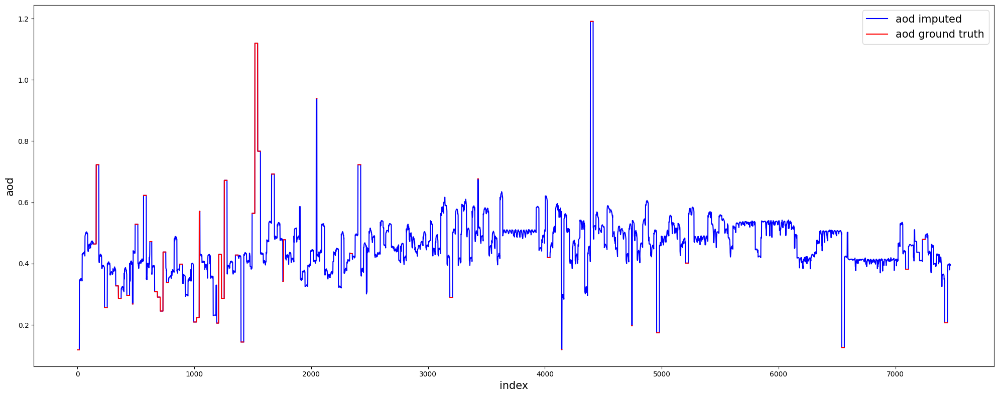


Handling for station 214



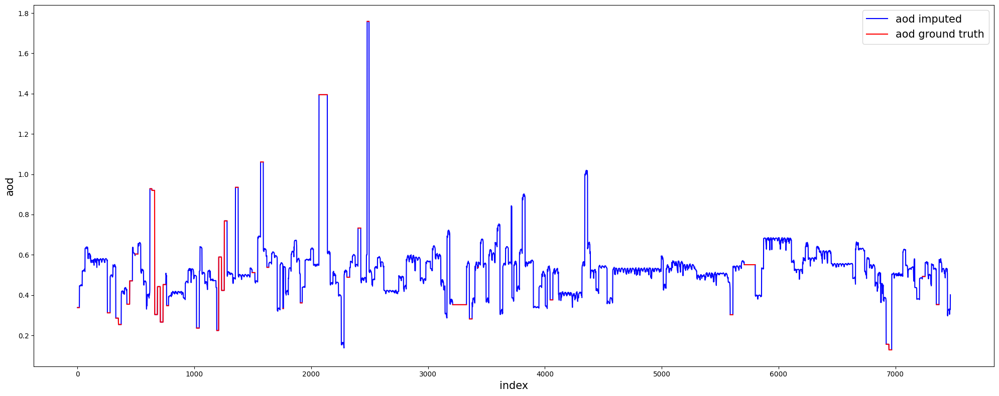


Handling for station 215



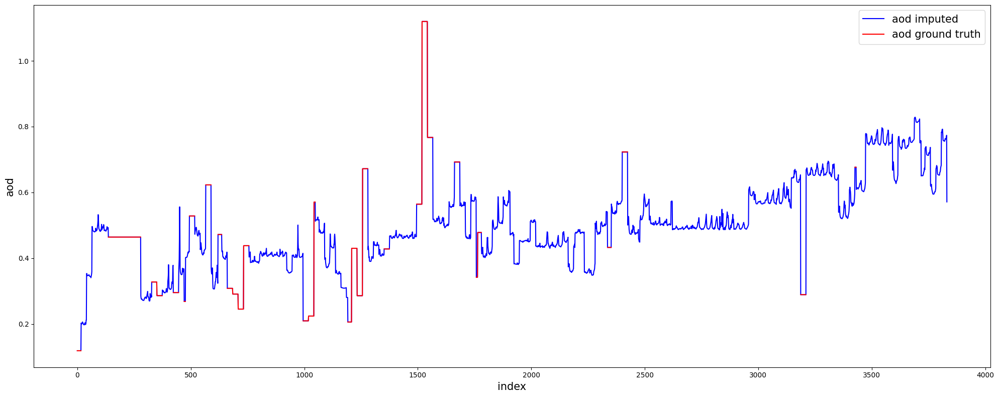


Handling for station 216



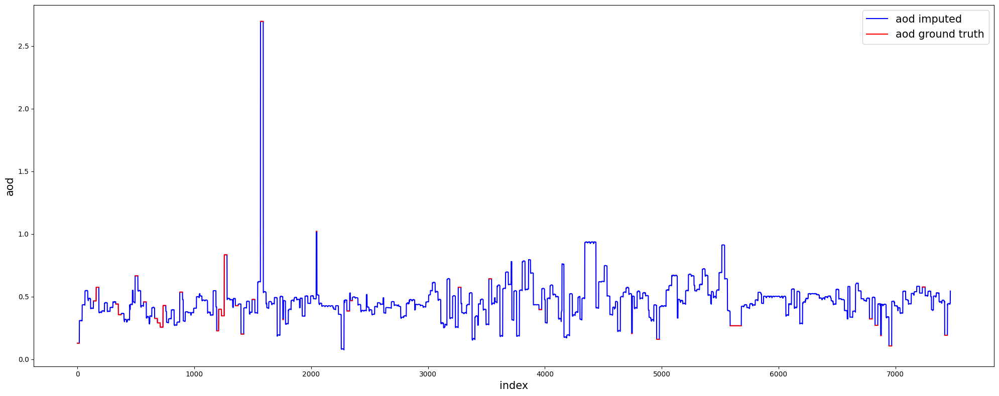

,pm25_cmaq,station,pm25,lat,lon,pm25_3km,tmp,rh,hpbl,wspd,...,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,aod
time,,,,,,,,,,,,,,,,,,,,,
2022-01-01 07:00:00,8.070718,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 08:00:00,9.922100,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 09:00:00,11.191617,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 10:00:00,11.655973,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
2022-01-01 11:00:00,11.074831,201,21.695652,10.783456,106.700622,22.705284,27.787918,61.073841,659.863586,1.885687,...,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,0.118424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 20:00:00,19.095100,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.443271
2022-12-30 21:00:00,8.860698,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.445299
2022-12-30 22:00:00,9.774303,216,33.091428,10.780482,106.659511,19.854403,24.979719,64.868401,680.533081,3.893373,...,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,0.445118


In [23]:
all_stations_df = []

for station in aod_all_stations:
    print(f"\nHandling for station {station}\n")
    # Get dataframe of current station
    df_aod_current_station = df_aod_raw[df_aod_raw["station"] == station]
    
    # Fill "aod" column
    #df_aod_current_station.loc[:, "aod"] = df_aod_current_station.loc[:, "aod"].fillna(df_aod_current_station.loc[:, "aod"].mean())
    df_aod_current_station_imputed = copy.deepcopy(df_aod_current_station)
    df_aod_current_station_imputed.loc[:, "aod"] = mice(df_aod_current_station_imputed.drop(columns=["station", "pm25"]))["aod"]
    plot_2_data(data1=df_aod_current_station_imputed["aod"],
               datalabel1="aod imputed",
               data2=df_aod_current_station["aod"],
               datalabel2="aod ground truth",
               ylabel="aod",
               xlabel="index")

    # Store file for debugging after filling missing values
    df_aod_current_station_imputed.to_csv(f"{conf['workspace']['data_by_station_dir']}/df_aod_{station}.csv", index=True)

    # Reappend the location to dataset
    all_stations_df.append(df_aod_current_station_imputed)

# Merge all stations
df_aod = pd.concat(all_stations_df)
df_aod

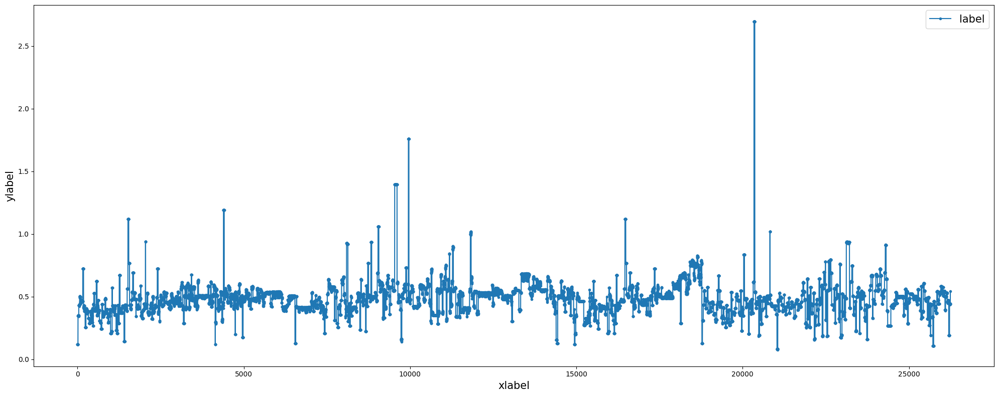

In [24]:
plot_1_data(df_aod["aod"])

In [25]:
df_aod.to_csv('df_aod.csv', index=True)

### Extract columns: time, stations, pm25_3km

In [26]:
# Get the time indices
aod_time_indices = df_aod.index
aod_time_indices

DatetimeIndex(['2022-01-01 07:00:00', '2022-01-01 08:00:00',
               '2022-01-01 09:00:00', '2022-01-01 10:00:00',
               '2022-01-01 11:00:00', '2022-01-01 12:00:00',
               '2022-01-01 13:00:00', '2022-01-01 14:00:00',
               '2022-01-01 15:00:00', '2022-01-01 16:00:00',
               ...
               '2022-12-30 15:00:00', '2022-12-30 16:00:00',
               '2022-12-30 17:00:00', '2022-12-30 18:00:00',
               '2022-12-30 19:00:00', '2022-12-30 20:00:00',
               '2022-12-30 21:00:00', '2022-12-30 22:00:00',
               '2022-12-30 23:00:00', '2022-12-31 00:00:00'],
              dtype='datetime64[ns]', name='time', length=26245, freq=None)

In [27]:
# Get the station column
aod_station_column = df_aod.loc[:, "station"]
aod_station_column

time
2022-01-01 07:00:00    201
2022-01-01 08:00:00    201
2022-01-01 09:00:00    201
2022-01-01 10:00:00    201
2022-01-01 11:00:00    201
                      ... 
2022-12-30 20:00:00    216
2022-12-30 21:00:00    216
2022-12-30 22:00:00    216
2022-12-30 23:00:00    216
2022-12-31 00:00:00    216
Name: station, Length: 26245, dtype: int64

In [28]:
# Get the pm25_3km column
aod_pm25_3km_column = df_aod.loc[:, "pm25_3km"]
aod_pm25_3km_column

time
2022-01-01 07:00:00    22.705284
2022-01-01 08:00:00    22.705284
2022-01-01 09:00:00    22.705284
2022-01-01 10:00:00    22.705284
2022-01-01 11:00:00    22.705284
                         ...    
2022-12-30 20:00:00    19.854403
2022-12-30 21:00:00    19.854403
2022-12-30 22:00:00    19.854403
2022-12-30 23:00:00    19.854403
2022-12-31 00:00:00    27.658358
Name: pm25_3km, Length: 26245, dtype: float64

### Split into features and labels
* Label: pm25
* Features: other columns
    * Dynamic features
    * Static features

In [29]:
# Features with pm25_3km
aod_feats = aod_stat_feats + aod_dyn_feats
# Predict without "station" as a feature
aod_feats.remove("station")
X_aod = df_aod.loc[:, aod_feats]

# Features without pm25_3km
aod_feats.remove("pm25_3km")
X_aod_no_pm25_3km = df_aod.loc[:, aod_feats]

# Label
y_aod = df_aod.loc[:, aod_label]

In [30]:
X_aod

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,pm25_cmaq,rh,wspd,hpbl,pm25_3km,aod,tmp
time,,,,,,,,,,,,,,,,,,,,
2022-01-01 07:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,8.070718,61.073841,1.885687,659.863586,22.705284,0.118424,27.787918
2022-01-01 08:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,9.922100,61.073841,1.885687,659.863586,22.705284,0.118424,27.787918
2022-01-01 09:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.191617,61.073841,1.885687,659.863586,22.705284,0.118424,27.787918
2022-01-01 10:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.655973,61.073841,1.885687,659.863586,22.705284,0.118424,27.787918
2022-01-01 11:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.074831,61.073841,1.885687,659.863586,22.705284,0.118424,27.787918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 20:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,19.095100,64.868401,3.893373,680.533081,19.854403,0.443271,24.979719
2022-12-30 21:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,8.860698,64.868401,3.893373,680.533081,19.854403,0.445299,24.979719
2022-12-30 22:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,9.774303,64.868401,3.893373,680.533081,19.854403,0.445118,24.979719


In [31]:
X_aod_no_pm25_3km

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,pm25_cmaq,rh,wspd,hpbl,aod,tmp
time,,,,,,,,,,,,,,,,,,,
2022-01-01 07:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,8.070718,61.073841,1.885687,659.863586,0.118424,27.787918
2022-01-01 08:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,9.922100,61.073841,1.885687,659.863586,0.118424,27.787918
2022-01-01 09:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.191617,61.073841,1.885687,659.863586,0.118424,27.787918
2022-01-01 10:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.655973,61.073841,1.885687,659.863586,0.118424,27.787918
2022-01-01 11:00:00,10.783456,106.700622,20680.62695,27.462461,6885.987305,18.537305,296.31157,764977.7039,0.0,1876.639945,232011.95950,0.0,2700.122924,11.074831,61.073841,1.885687,659.863586,0.118424,27.787918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-30 20:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,19.095100,64.868401,3.893373,680.533081,0.443271,24.979719
2022-12-30 21:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,8.860698,64.868401,3.893373,680.533081,0.445299,24.979719
2022-12-30 22:00:00,10.780482,106.659511,57523.91406,33.629780,2345.868408,6.057246,10370.90496,885181.4309,0.0,8099.182920,95807.40771,0.0,1879.344348,9.774303,64.868401,3.893373,680.533081,0.445118,24.979719


In [32]:
y_aod

,pm25
time,
2022-01-01 07:00:00,21.695652
2022-01-01 08:00:00,21.695652
2022-01-01 09:00:00,21.695652
2022-01-01 10:00:00,21.695652
2022-01-01 11:00:00,21.695652
...,...
2022-12-30 20:00:00,33.091428
2022-12-30 21:00:00,33.091428
2022-12-30 22:00:00,33.091428


### Data normalization

In [33]:
# Scaled features
aod_features_scaler = MinMaxScaler()
X_aod_scaled = aod_features_scaler.fit_transform(X_aod)
X_aod_scaled = pd.DataFrame(X_aod_scaled, columns=X_aod.columns)
X_aod_scaled

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,pm25_cmaq,rh,wspd,hpbl,pm25_3km,aod,tmp
0,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.033495,0.276706,0.151021,0.457426,0.357390,0.016363,0.401276
1,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.041687,0.276706,0.151021,0.457426,0.357390,0.016363,0.401276
2,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.047303,0.276706,0.151021,0.457426,0.357390,0.016363,0.401276
3,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.049358,0.276706,0.151021,0.457426,0.357390,0.016363,0.401276
4,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.046787,0.276706,0.151021,0.457426,0.357390,0.016363,0.401276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26240,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.082271,0.362385,0.549315,0.473268,0.293925,0.140295,0.092629
26241,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.036991,0.362385,0.549315,0.473268,0.293925,0.141069,0.092629
26242,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.041033,0.362385,0.549315,0.473268,0.293925,0.141000,0.092629
26243,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.043538,0.362385,0.549315,0.473268,0.293925,0.140957,0.092629


In [34]:
# Scaled features without pm25_3km
aod_features_no_pm25_3km_scaler = MinMaxScaler()
X_aod_no_pm25_3km_scaled = aod_features_no_pm25_3km_scaler.fit_transform(X_aod_no_pm25_3km)
X_aod_no_pm25_3km_scaled = pd.DataFrame(X_aod_no_pm25_3km_scaled, columns=X_aod_no_pm25_3km.columns)
X_aod_no_pm25_3km_scaled

,lat,lon,pop,road_den_1km,prim_road_len_1km,near_dist,bareland,builtup,cropland,grassland,treecover,water,ndvi,pm25_cmaq,rh,wspd,hpbl,aod,tmp
0,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.033495,0.276706,0.151021,0.457426,0.016363,0.401276
1,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.041687,0.276706,0.151021,0.457426,0.016363,0.401276
2,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.047303,0.276706,0.151021,0.457426,0.016363,0.401276
3,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.049358,0.276706,0.151021,0.457426,0.016363,0.401276
4,0.178597,0.710219,0.029265,0.423978,0.926097,0.834737,0.0,0.0,0.0,0.222222,1.000000,0.0,1.000000,0.046787,0.276706,0.151021,0.457426,0.016363,0.401276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26240,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.082271,0.362385,0.549315,0.473268,0.140295,0.092629
26241,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.036991,0.362385,0.549315,0.473268,0.141069,0.092629
26242,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.041033,0.362385,0.549315,0.473268,0.141000,0.092629
26243,0.103161,0.000000,1.000000,1.000000,0.003781,0.183246,1.0,1.0,0.0,1.000000,0.030921,0.0,0.161351,0.043538,0.362385,0.549315,0.473268,0.140957,0.092629


In [35]:
# Scaled label
aod_label_scaler = MinMaxScaler(feature_range=(0, 1))
y_aod_scaled = aod_label_scaler.fit_transform(y_aod)
y_aod_scaled = pd.DataFrame(y_aod_scaled, columns=y_aod.columns)
y_aod_scaled

,pm25
0,0.295749
1,0.295749
2,0.295749
3,0.295749
4,0.295749
...,...
26240,0.499505
26241,0.499505
26242,0.499505
26243,0.499505


## Dimensionality Reduction Comparation

To compare the effect of each method, we will do the following things:
* Use the pm25 as the label
* Use other columns as the input features
* Reduce the dimension of input data using above methods
* Pass the processed input data to a model (e.g. LSTM, ...)

### Evaluation board

In [36]:
evaluation_board = {'with_pm25_3km': [], 'dim_reduction_method': [], 'dim_after_reduction': [], 'prediction':[], 'mae': [], 'mse': [], 'r2': []}

### Range of dimension

In [37]:
RANGE_OF_DIMENSION = range(conf["reduction"]["min_number_of_features"], X_aod_scaled.shape[1])
#RANGE_OF_DIMENSION = range(2, 5)
for n in RANGE_OF_DIMENSION:
  print(n, end=' ')

print()

RANGE_OF_DIMENSION_NO_PM25_3KM = range(conf["reduction"]["min_number_of_features"], X_aod_no_pm25_3km_scaled.shape[1])
#RANGE_OF_DIMENSION_NO_PM25_3KM = range(2, 5)
for n in RANGE_OF_DIMENSION_NO_PM25_3KM:
  print(n, end=' ')

15 16 17 18 19 
15 16 17 18 

### Prediction without reduction

#### With pm25_3km

I0000 00:00:1755523790.074316 1614446 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 838 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:39:00.0, compute capability: 8.0


Model: "aod_LSTMPrediction_no_dim_reduction"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 24, 21)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ [(None, 64),      │     22,016 │ input_layer[0][0] │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 24, 64)    │          0 │ lstm[0][0]        │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 24, 64)    │     33,024 │ repeat_vector[0]… │
│                     │                   │            │ lstm[0][1],       │
│                     │                   │            │ lstm[0][2]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 24, 64)    │          0 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 24, 32)    │      2,080 │ dropout[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 24, 1)     │         33 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 57,153 (223.25 KB)

 Trainable params: 57,153 (223.25 KB)

 Non-trainable params: 0 (0.00 B)

None


I0000 00:00:1755523803.665300 1614543 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


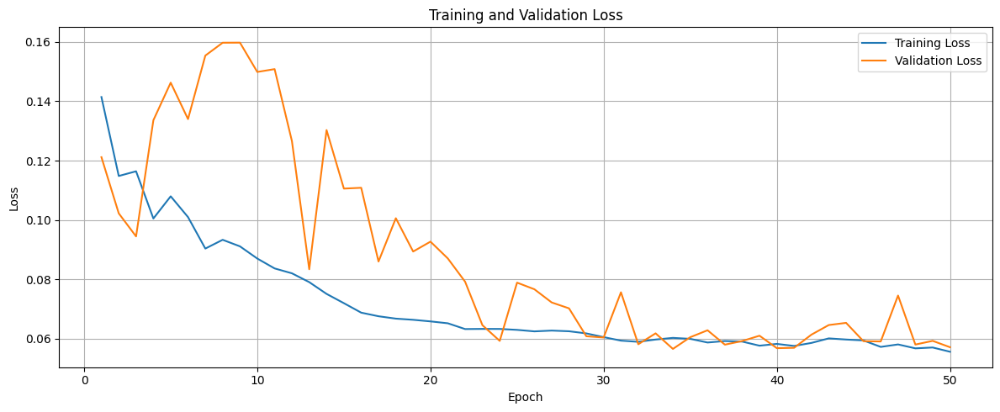

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


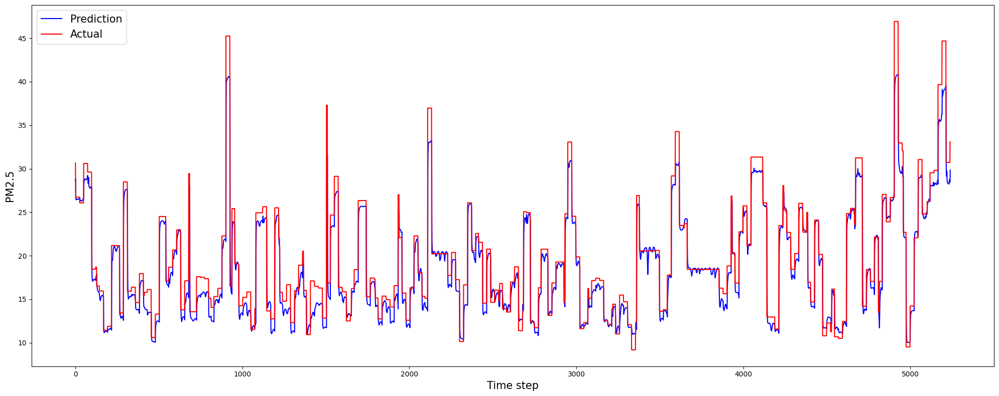

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


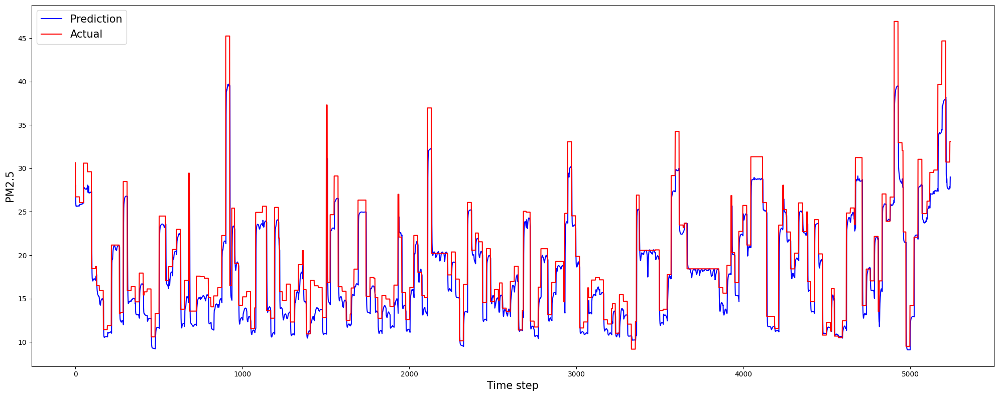

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


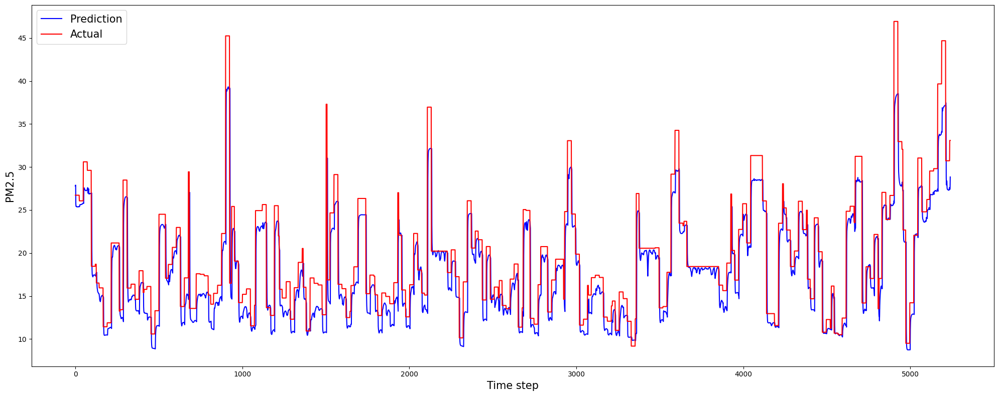

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


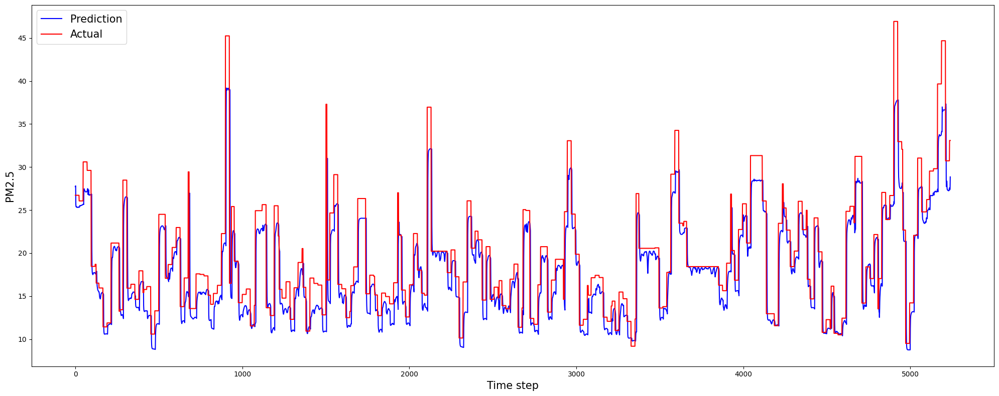

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


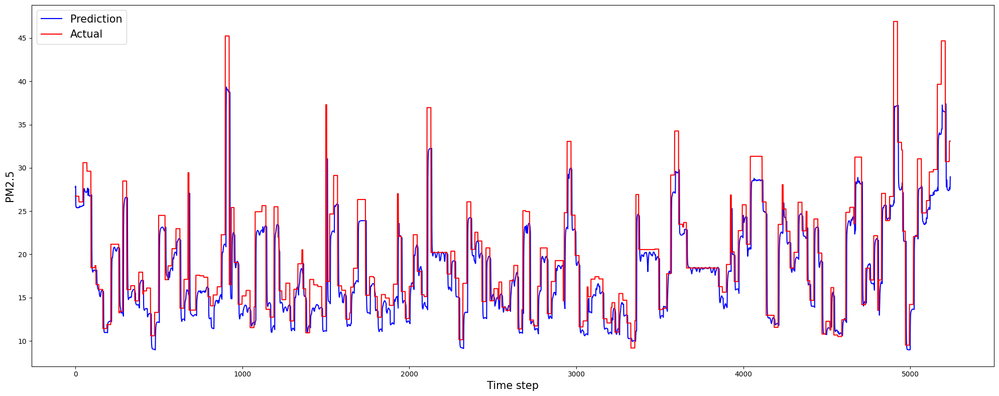

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


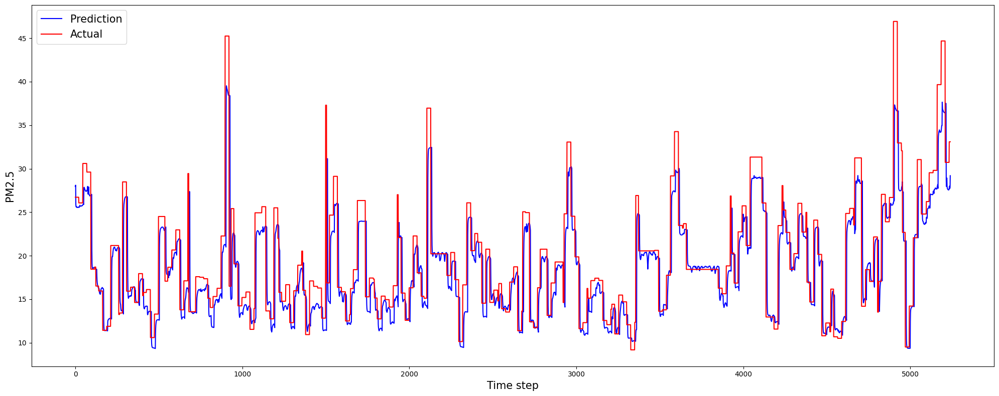

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


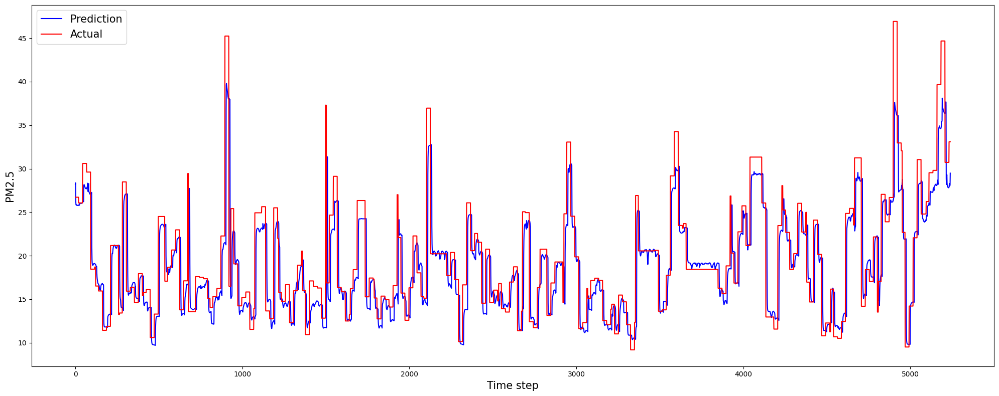

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


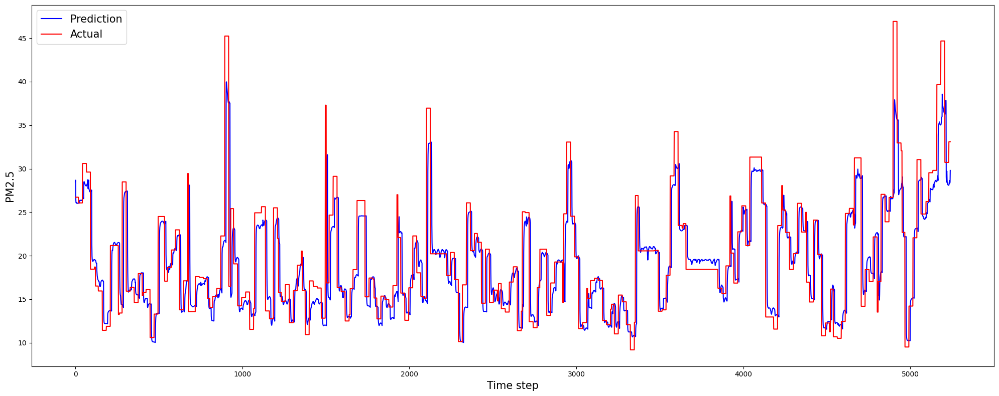

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


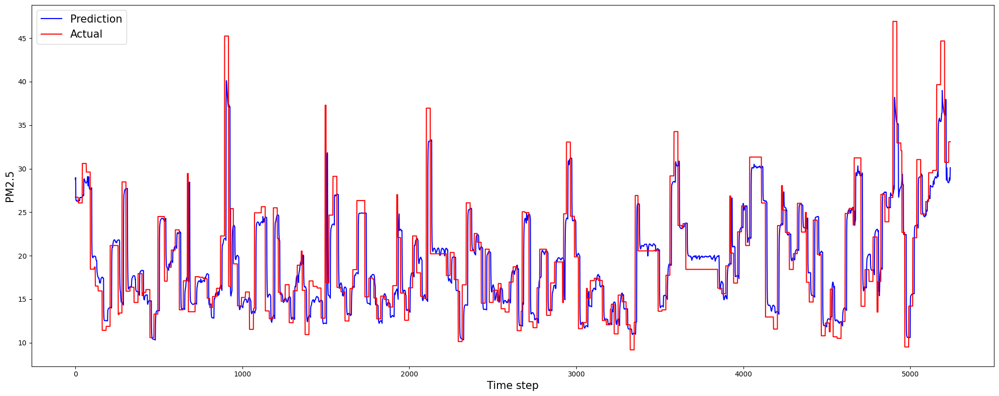

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


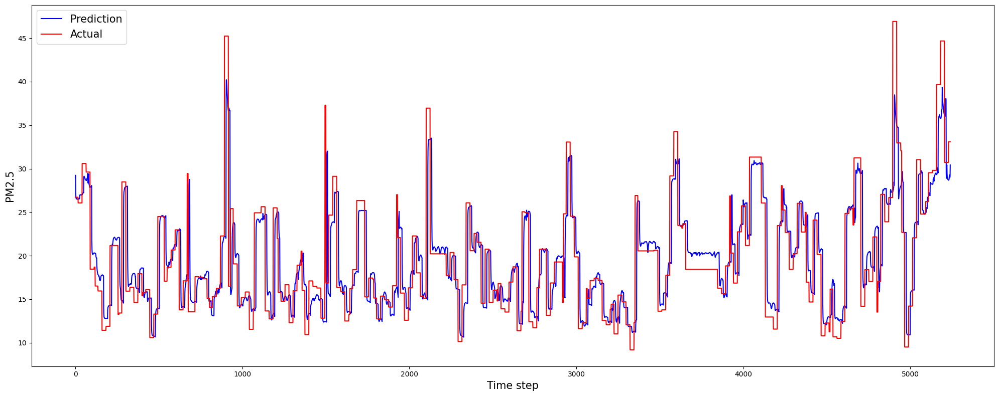

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


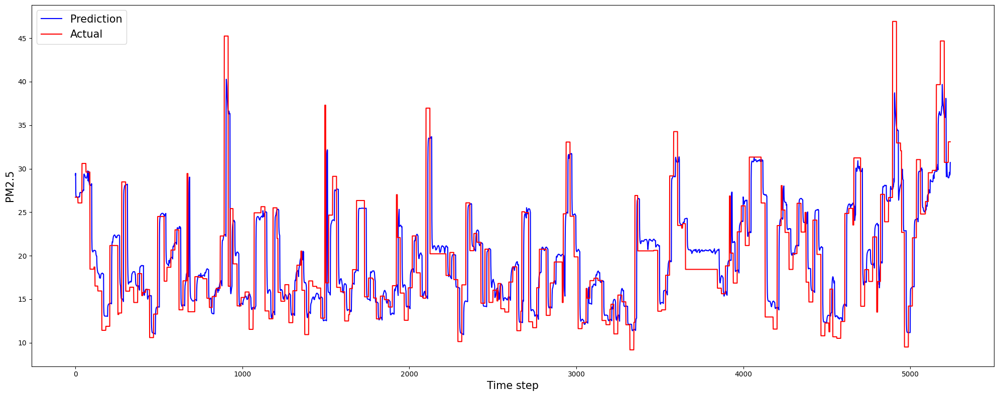

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


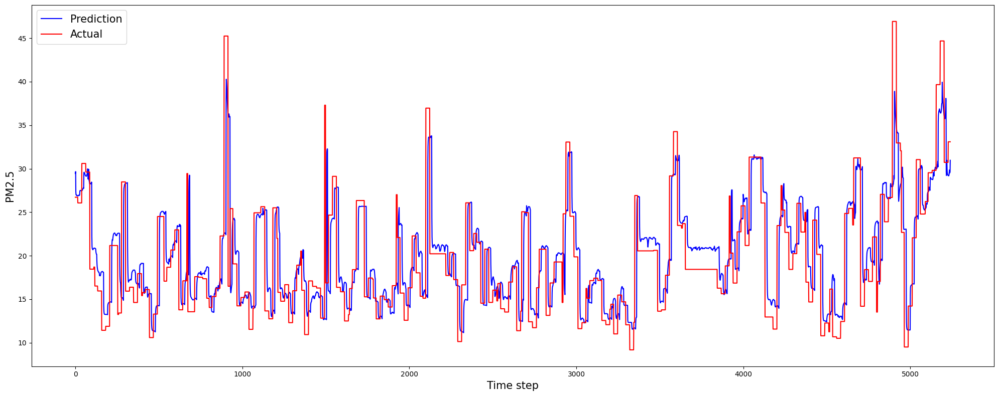

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


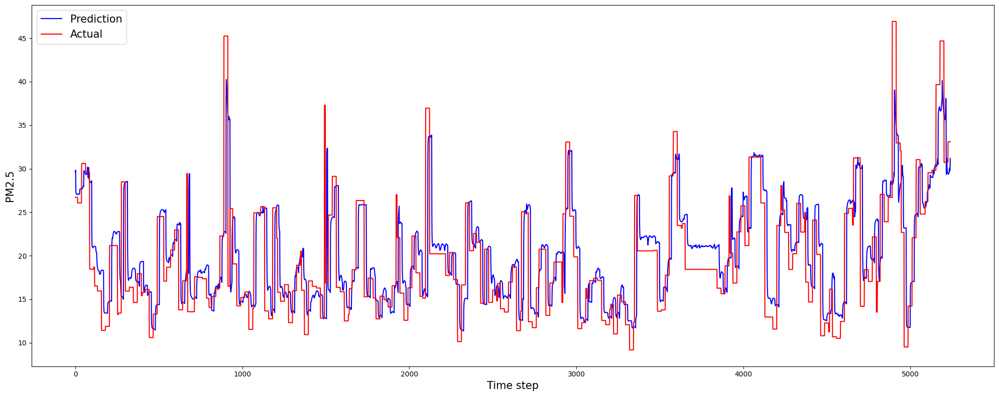

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


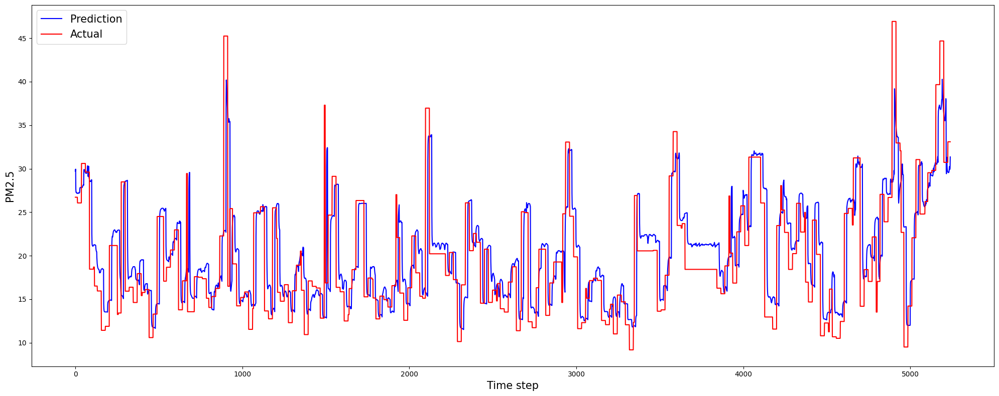

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


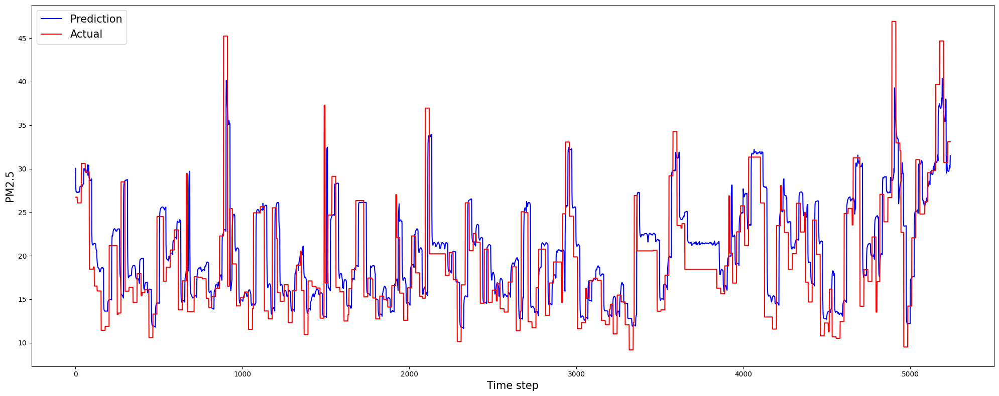

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


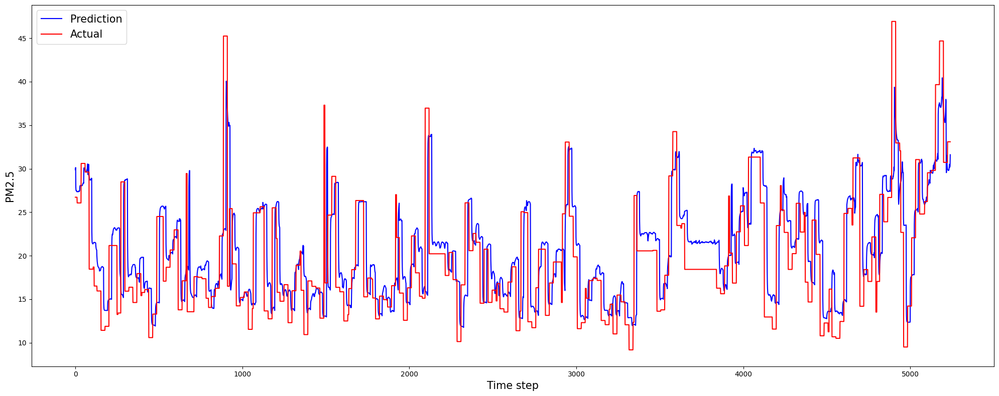

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


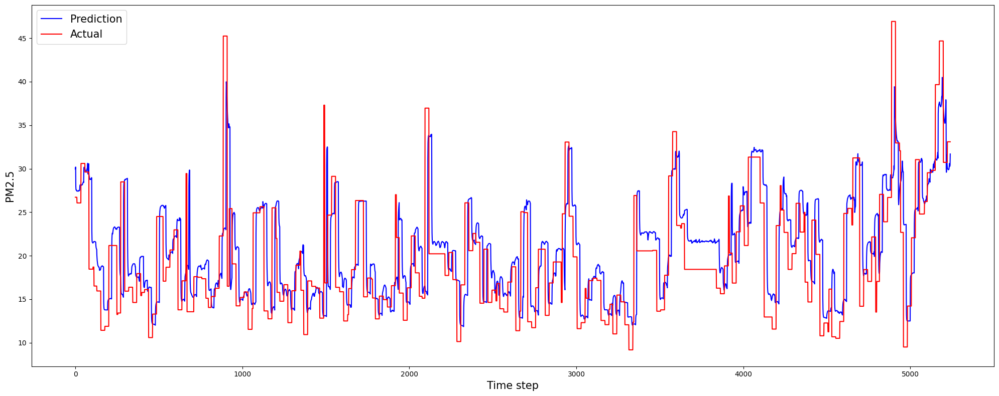

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


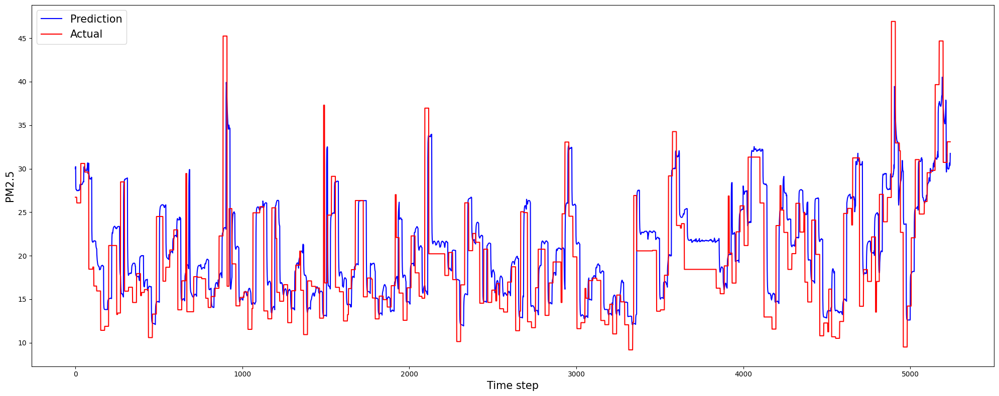

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


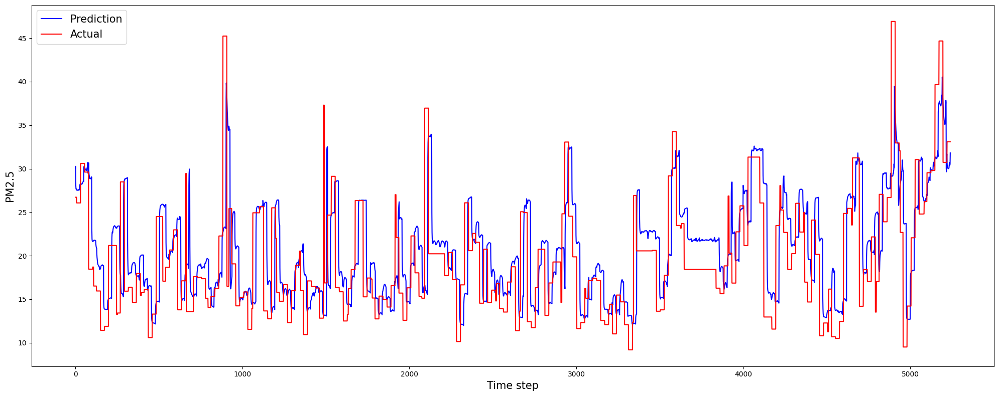

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


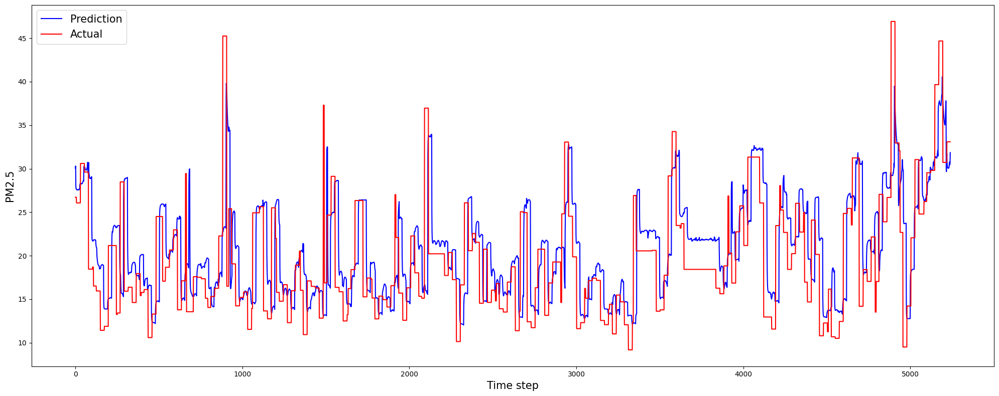

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


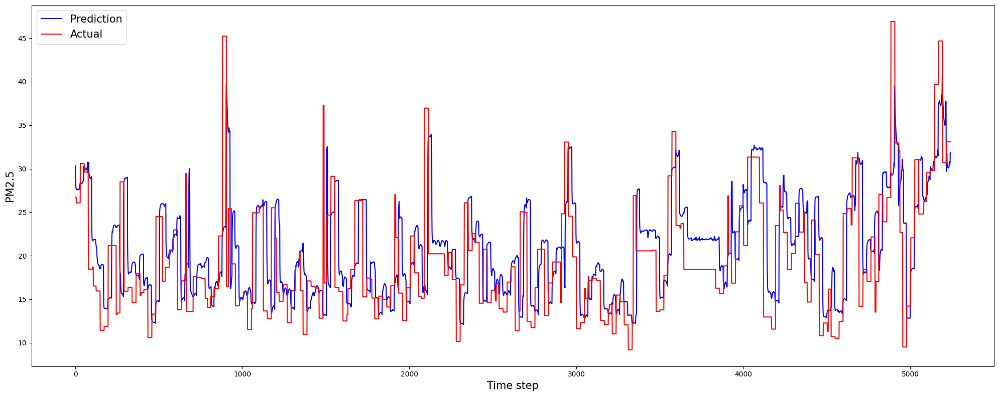

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


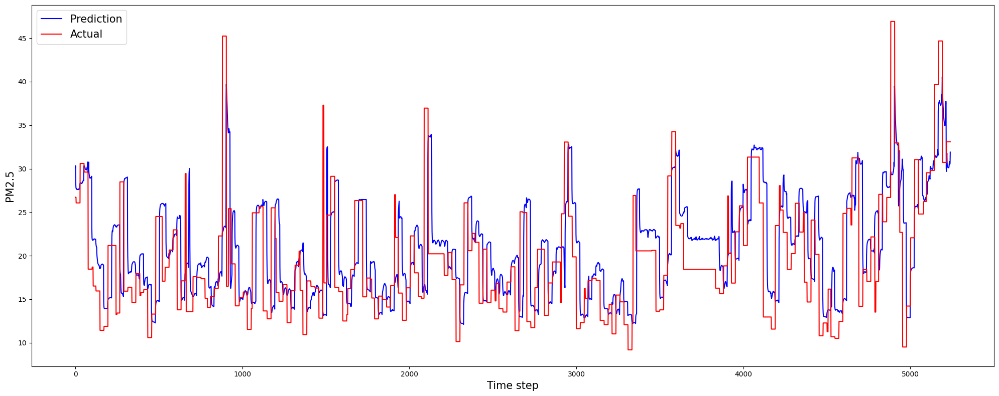

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


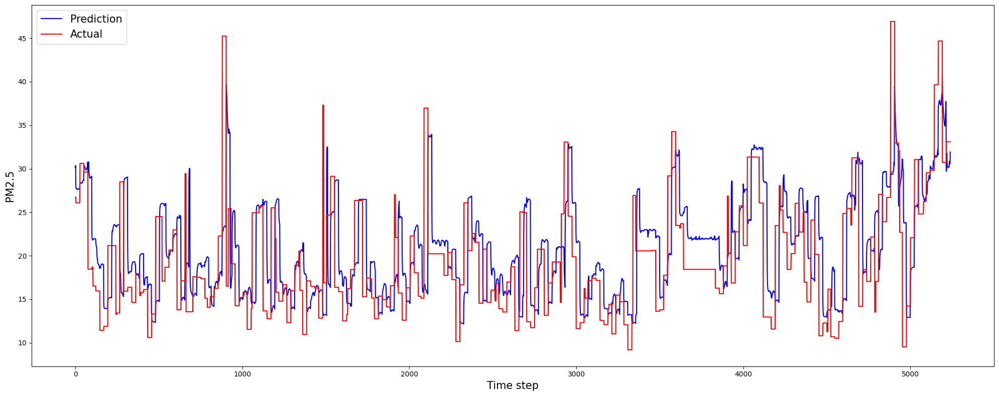

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


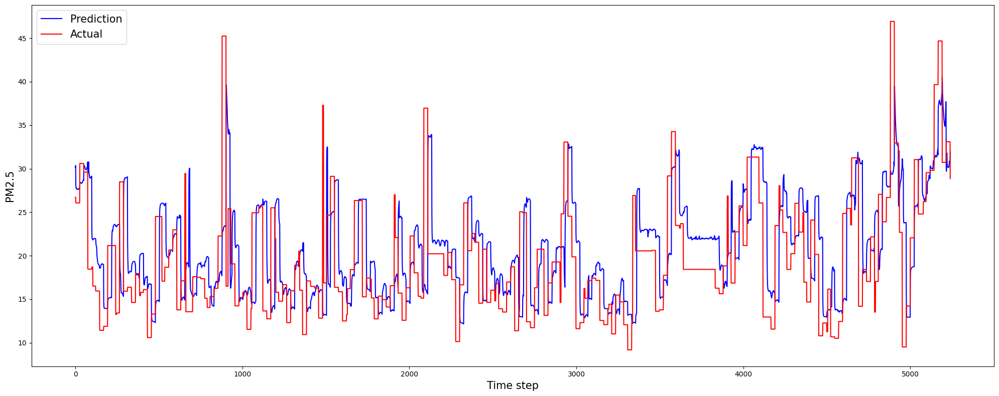

,with_pm25_3km,dim_reduction_method,dim_after_reduction,prediction,mae,mse,r2
0,Yes,None,N/A,LSTM,3.128129,23.018005,0.286113


In [38]:
# Prediction
lstmpred = LSTMPrediction(X_aod_scaled, y_aod_scaled,
                            aod_label_scaler,
                            val_percentage=0.2, test_percentage=0.2,
                            n_past=conf["prediction"]["n_past"], n_future=conf["prediction"]["n_future"],
                            epochs=conf["prediction"]["epochs"], batch_size=conf["prediction"]["batch_size"],
                            model_name=f"aod_{LSTMPrediction.class_name}_no_dim_reduction",
                            verbose=0)
lstmpred.get_model_info()
all_days_inv_y_pred, all_days_inv_y_test, all_days_mae, avg_mae, all_days_mse, avg_mse, all_days_r2, avg_r2 = lstmpred.execute()


# Visualize the prediction
plot_prediction(all_days_inv_y_pred, all_days_inv_y_test, conf["prediction"]["n_future"])

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["None"]
evaluation_board['dim_after_reduction'] += ["N/A"]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [avg_mae]
evaluation_board['mse'] += [avg_mse]
evaluation_board['r2'] += [avg_r2]
evaluation_board['with_pm25_3km'] += ["Yes"]
pd.DataFrame(evaluation_board)

#### No pm25_3km

Model: "aod_LSTMPrediction_no_dim_reduction_no_pm25_3km"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 24, 20)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ [(None, 64),      │     21,760 │ input_layer_1[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 24, 64)    │          0 │ lstm_2[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 24, 64)    │     33,024 │ repeat_vector_1[… │
│                     │                   │            │ lstm_2[0][1],     │
│                     │                   │            │ lstm_2[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 24, 64)    │          0 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_2  │ (None, 24, 32)    │      2,080 │ dropout_1[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_3  │ (None, 24, 1)     │         33 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 56,897 (222.25 KB)

 Trainable params: 56,897 (222.25 KB)

 Non-trainable params: 0 (0.00 B)

None


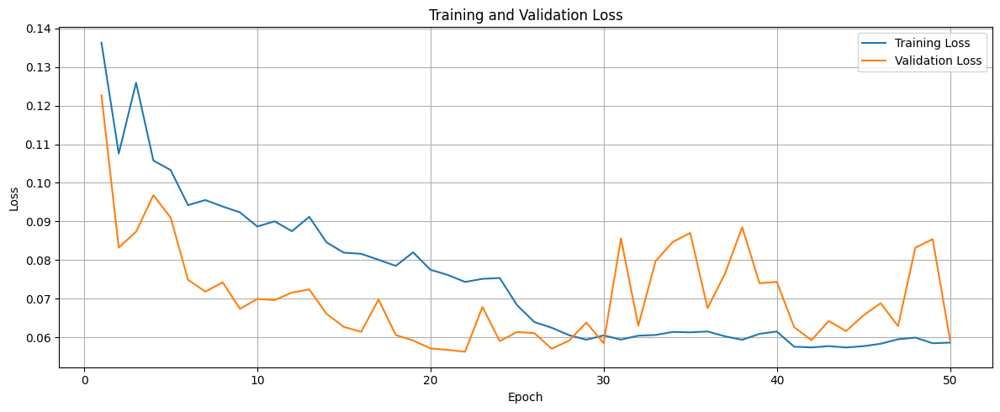

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


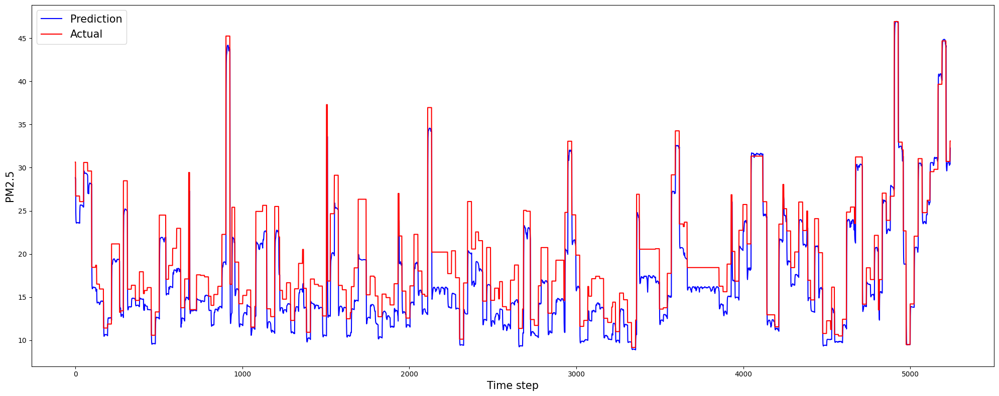

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


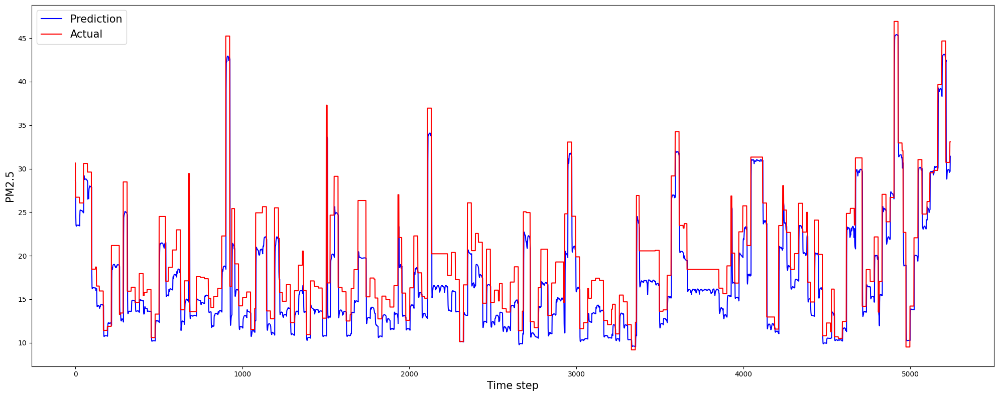

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


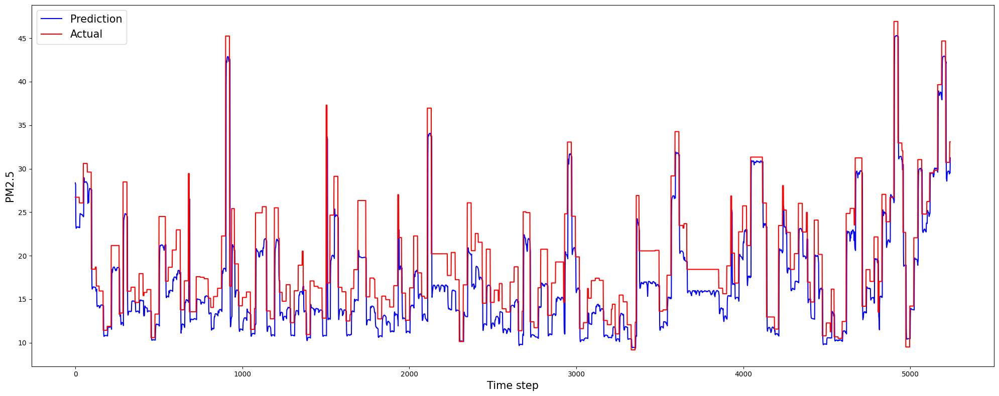

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


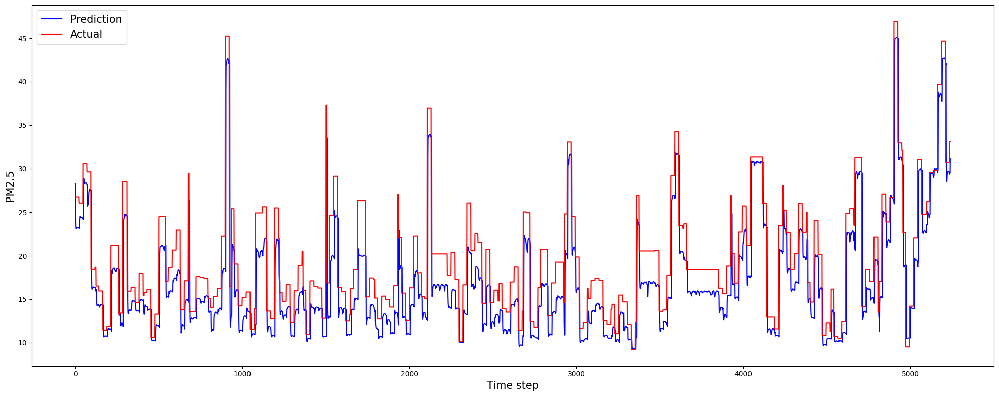

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


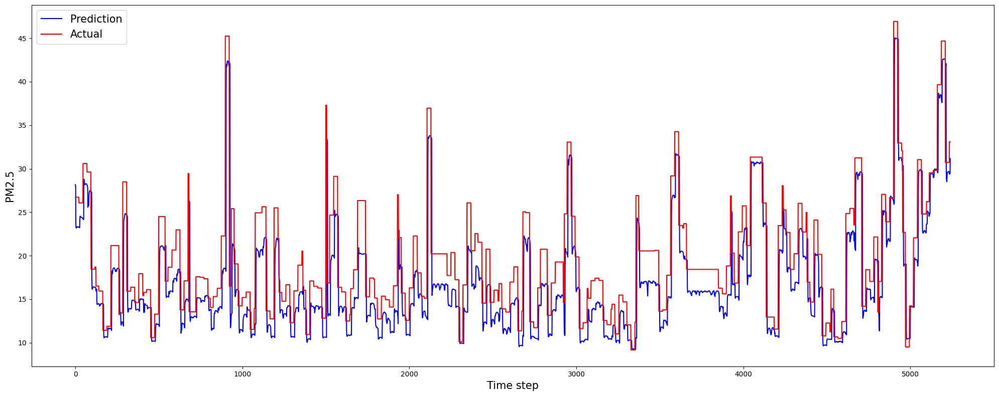

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


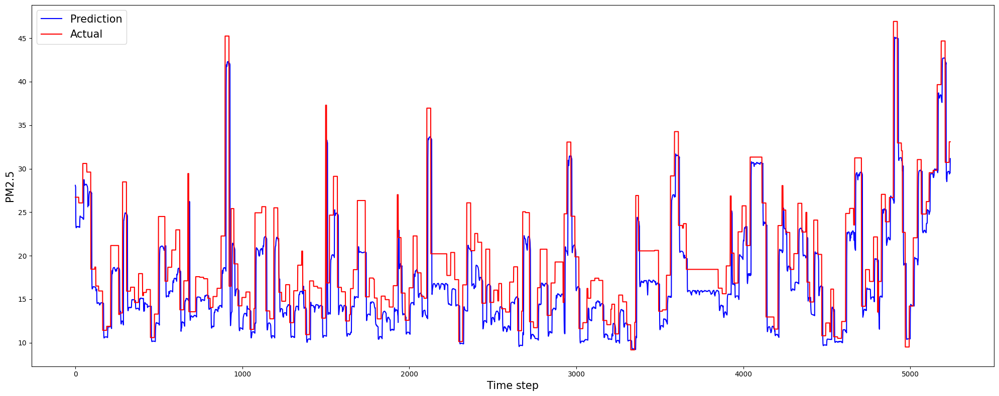

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


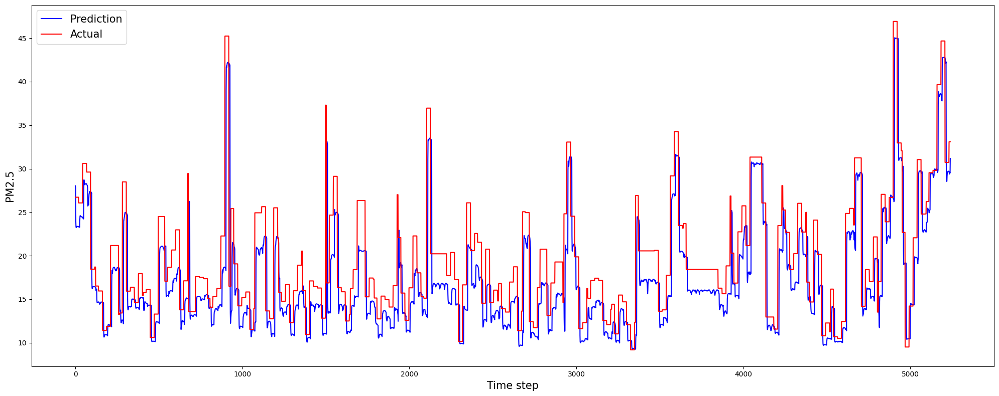

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


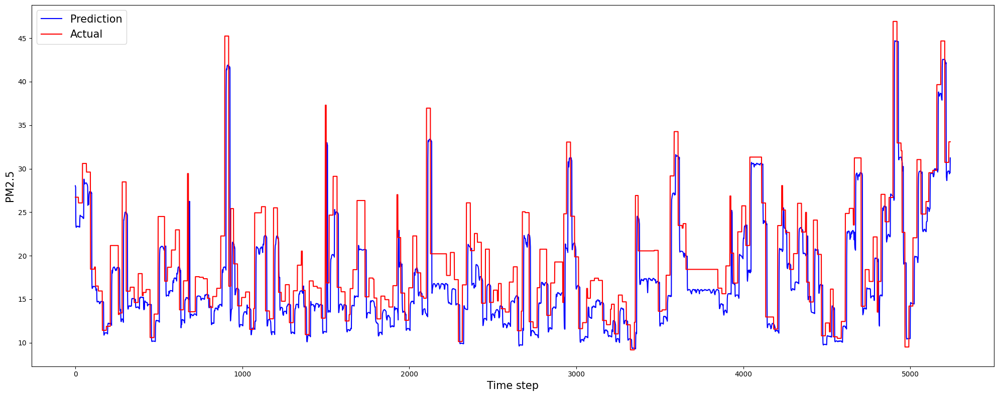

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


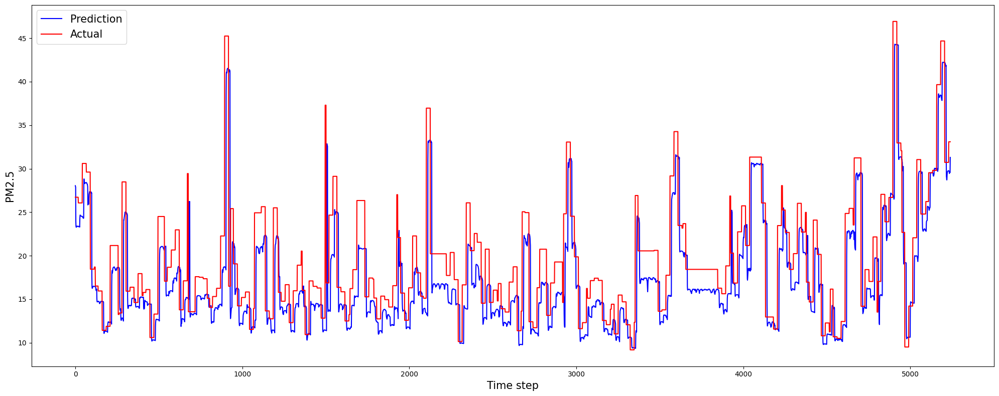

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


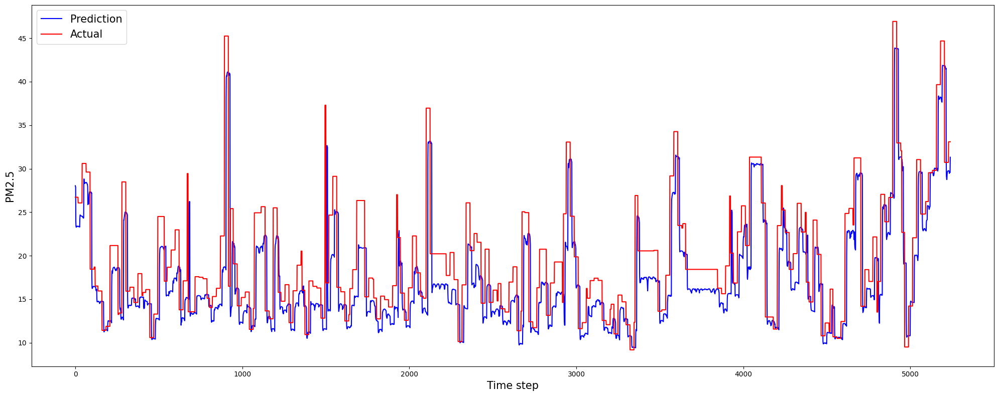

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


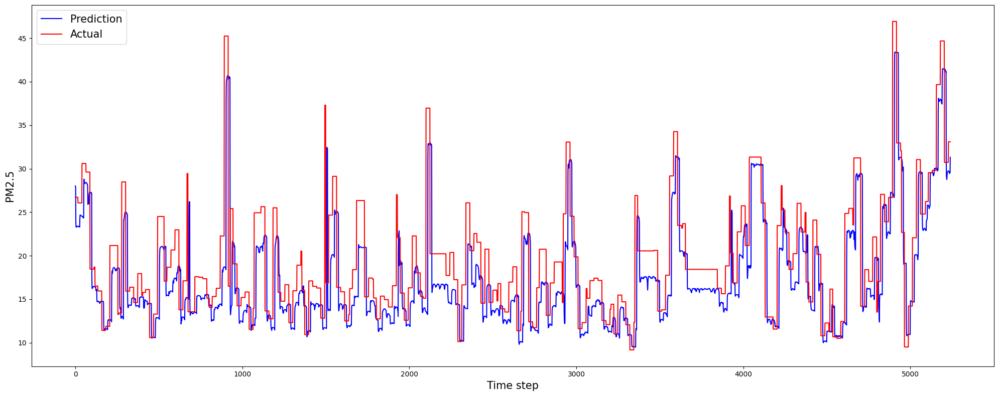

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


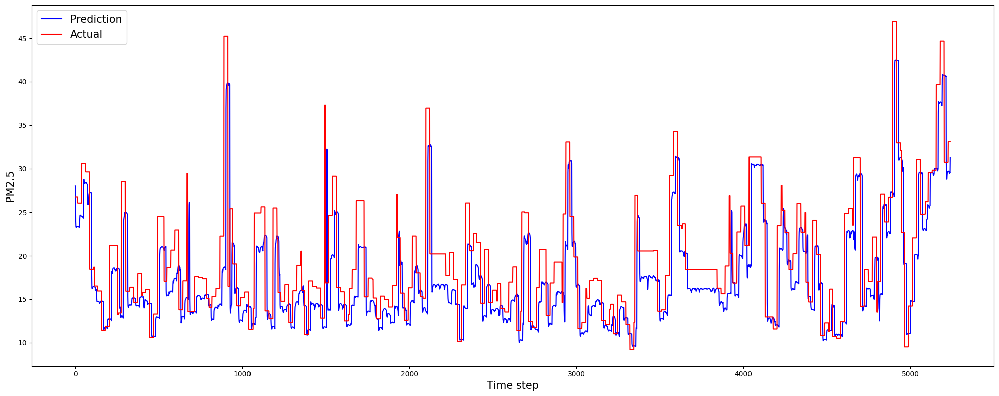

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


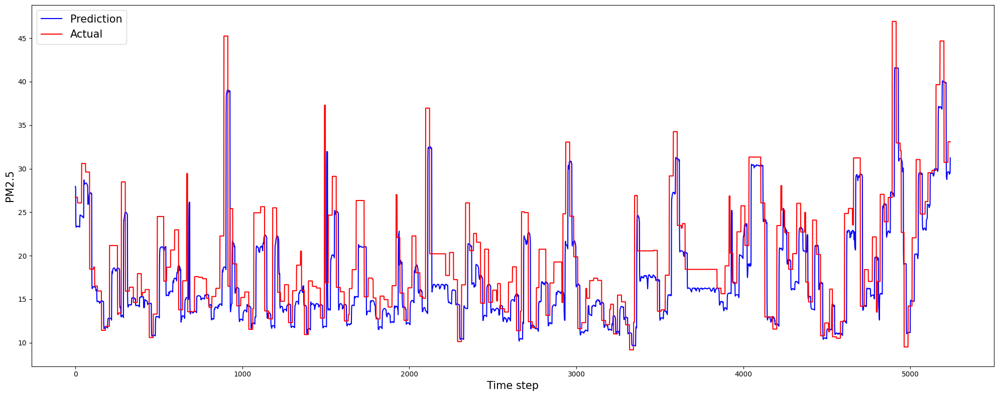

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


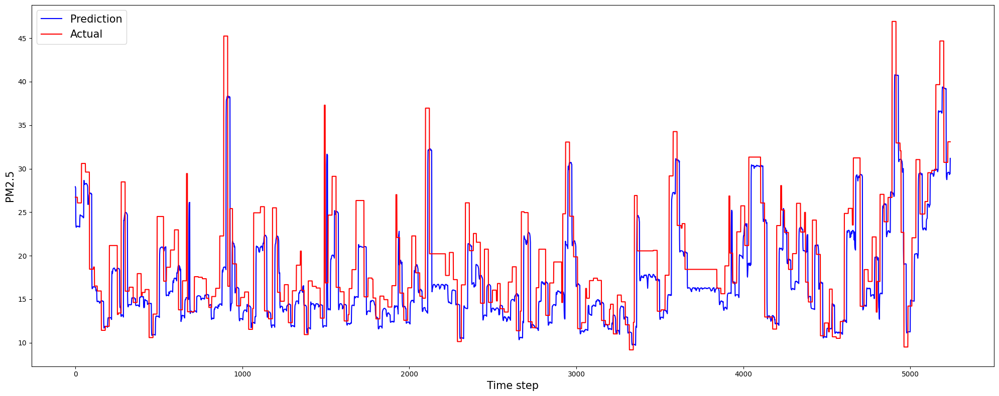

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


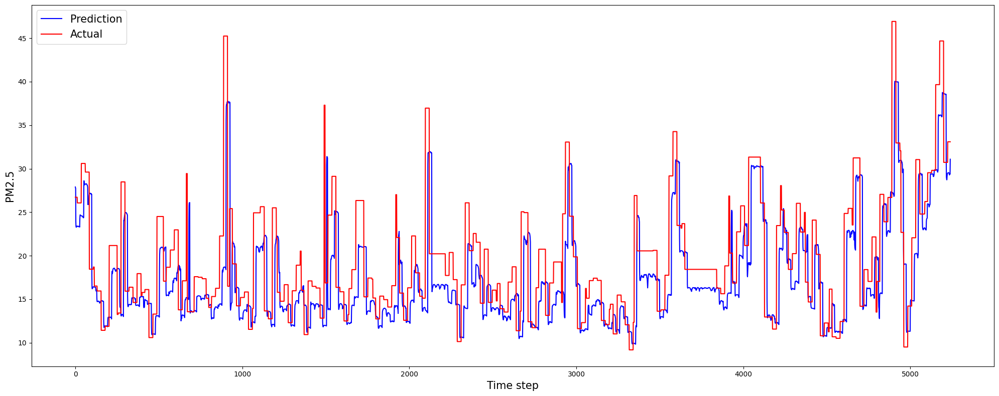

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


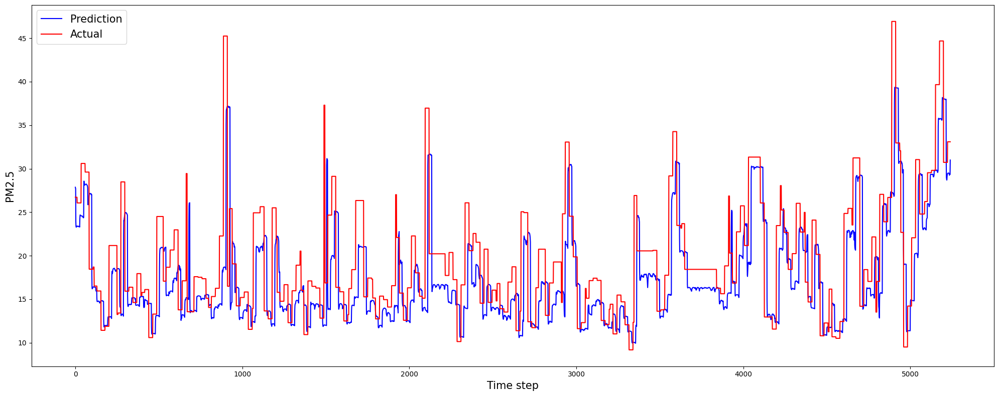

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


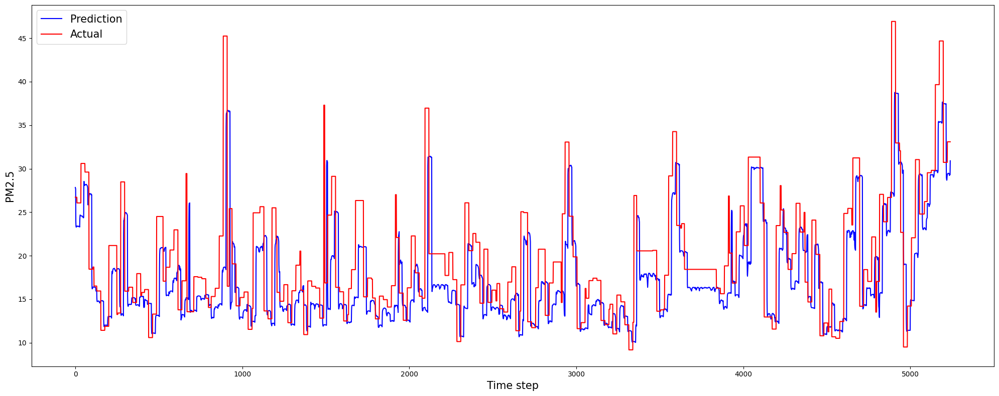

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


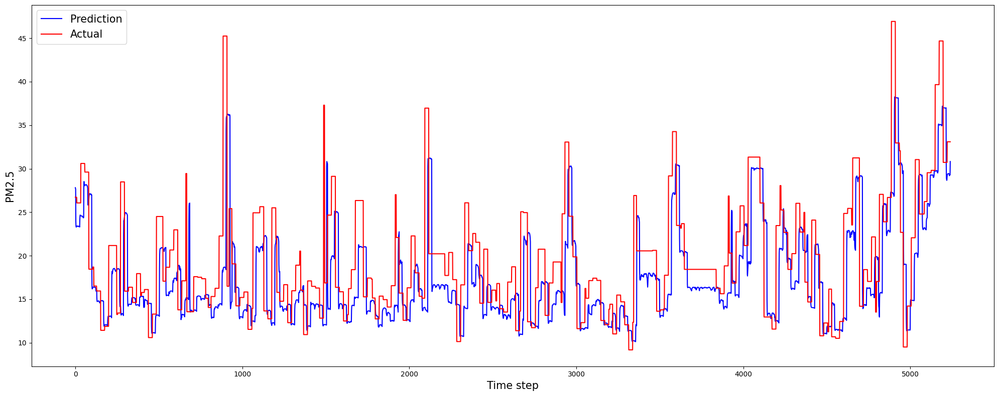

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


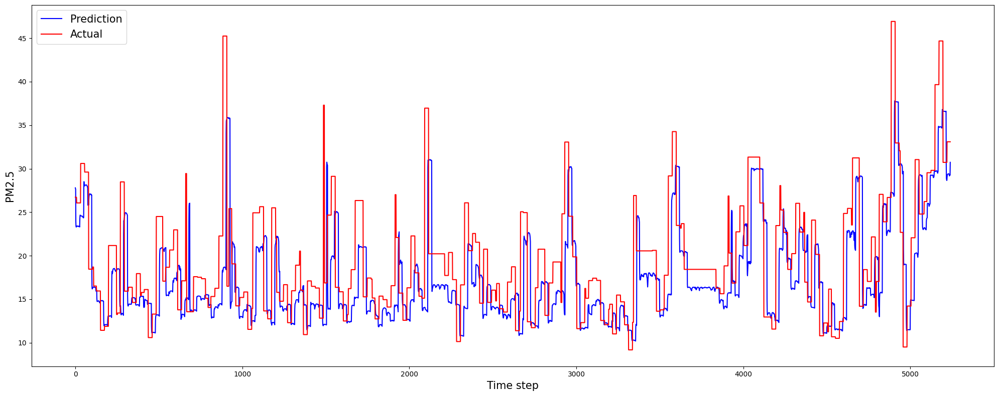

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


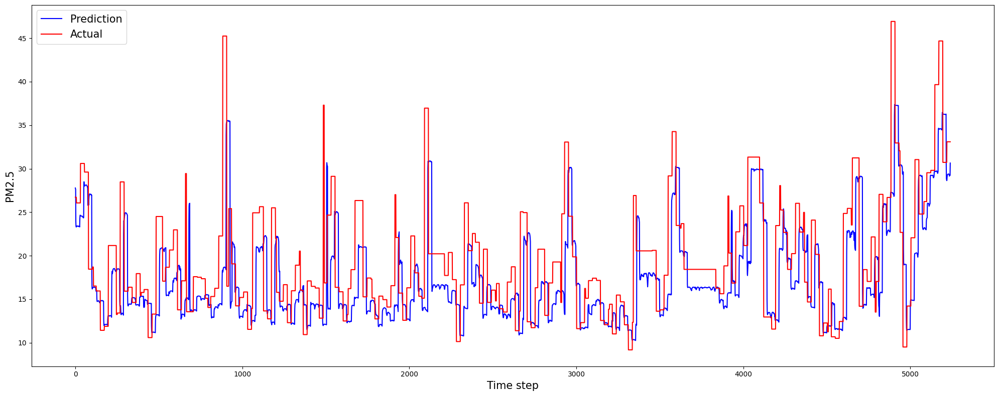

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


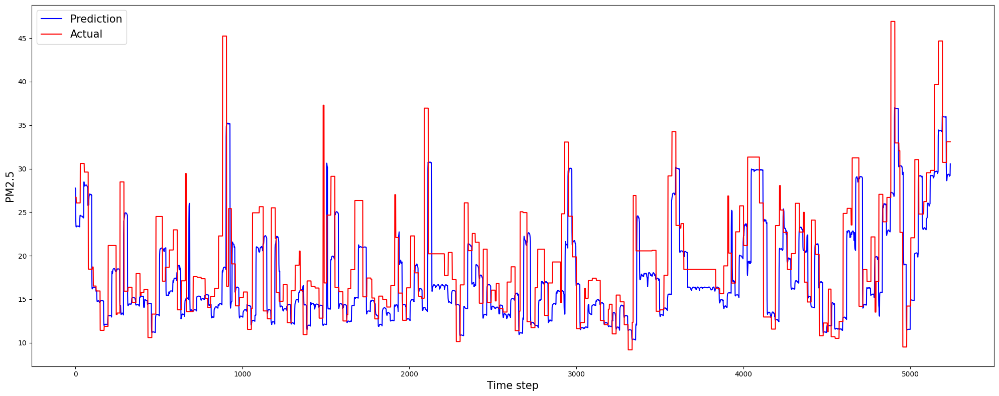

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


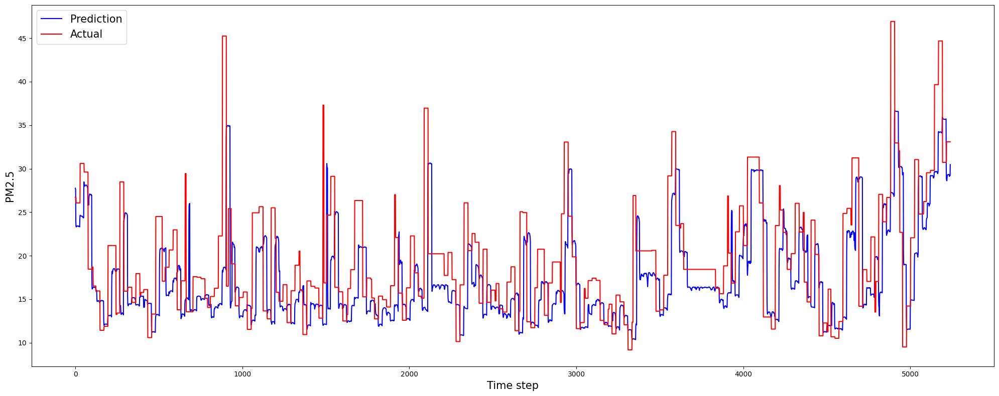

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


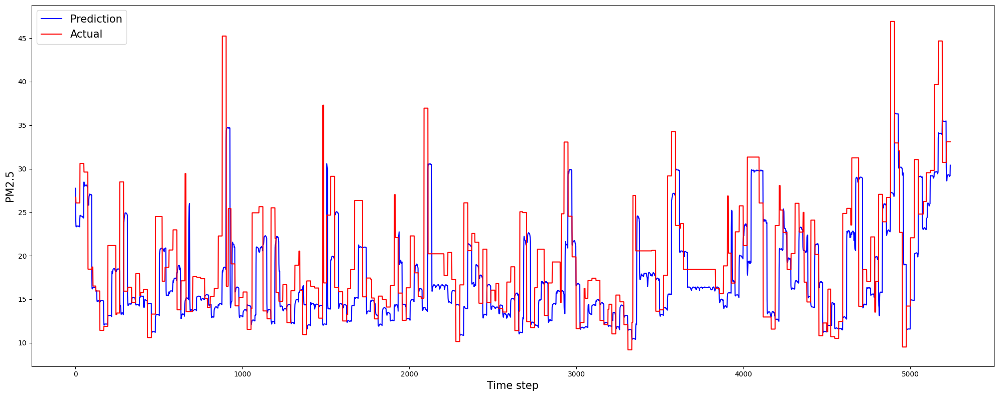

inv_y_pred.shape = (5240, 1)
inv_y_test.shape = (5240, 1)


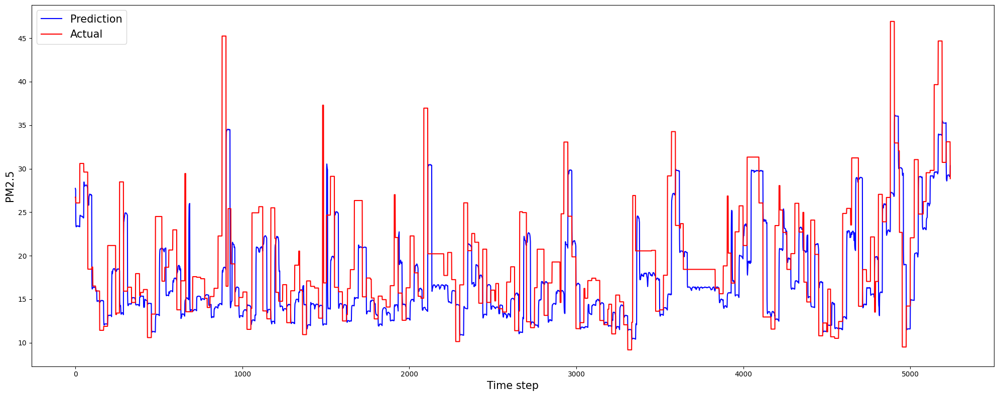

,with_pm25_3km,dim_reduction_method,dim_after_reduction,prediction,mae,mse,r2
0,Yes,None,N/A,LSTM,3.128129,23.018005,0.286113
1,No,None,N/A,LSTM,3.606927,25.847995,0.224020


In [39]:
# Prediction
lstmpred = LSTMPrediction(X_aod_no_pm25_3km_scaled, y_aod_scaled,
                            aod_label_scaler,
                            val_percentage=0.2, test_percentage=0.2,
                            n_past=conf["prediction"]["n_past"], n_future=conf["prediction"]["n_future"],
                            epochs=conf["prediction"]["epochs"], batch_size=conf["prediction"]["batch_size"],
                            model_name=f"aod_{LSTMPrediction.class_name}_no_dim_reduction_no_pm25_3km",
                            verbose=0)
lstmpred.get_model_info()
all_days_inv_y_pred, all_days_inv_y_test, all_days_mae, avg_mae, all_days_mse, avg_mse, all_days_r2, avg_r2 = lstmpred.execute()

# Visualize the prediction
plot_prediction(all_days_inv_y_pred, all_days_inv_y_test, conf["prediction"]["n_future"])

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["None"]
evaluation_board['dim_after_reduction'] += ["N/A"]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [avg_mae]
evaluation_board['mse'] += [avg_mse]
evaluation_board['r2'] += [avg_r2]
evaluation_board['with_pm25_3km'] += ["No"]
pd.DataFrame(evaluation_board)

### Prediction + LSTM-Seq2Seq

#### Doing the loop

Model: "aod_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 7, 20)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 7, 100)    │     48,400 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ [(None, 50),      │     30,200 │ lstm_4[0][0]      │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 15)        │        765 │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_2     │ (None, 7, 15)     │          0 │ dense_4[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 7, 50)     │     13,200 │ repeat_vector_2[… │
│                     │                   │            │ lstm_5[0][1],     │
│                     │                   │            │ lstm_5[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_7 (LSTM)       │ (None, 7, 100)    │     60,400 │ lstm_6[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_4  │ (None, 7, 20)     │      2,020 │ lstm_7[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 464,957 (1.77 MB)

 Trainable params: 154,985 (605.41 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 309,972 (1.18 MB)

None


Model: "aod_LSTMSeq2SeqReduction_15_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 7, 20)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 7, 100)         │        48,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 15)             │           765 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,365 (310.02 KB)

 Trainable params: 79,365 (310.02 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "aod_LSTMPrediction_with_LSTMSeq2SeqReduction_15_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 24, 16)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ [(None, 64),      │     20,736 │ input_layer_4[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_3     │ (None, 24, 64)    │          0 │ lstm_8[0][0]      │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ (None, 24, 64)    │     33,024 │ repeat_vector_3[… │
│                     │                   │            │ lstm_8[0][1],     │
│                     │                   │            │ lstm_8[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 24, 64)    │          0 │ lstm_9[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_5  │ (None, 24, 32)    │      2,080 │ dropout_2[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_6  │ (None, 24, 1)     │         33 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 55,873 (218.25 KB)

 Trainable params: 55,873 (218.25 KB)

 Non-trainable params: 0 (0.00 B)

None


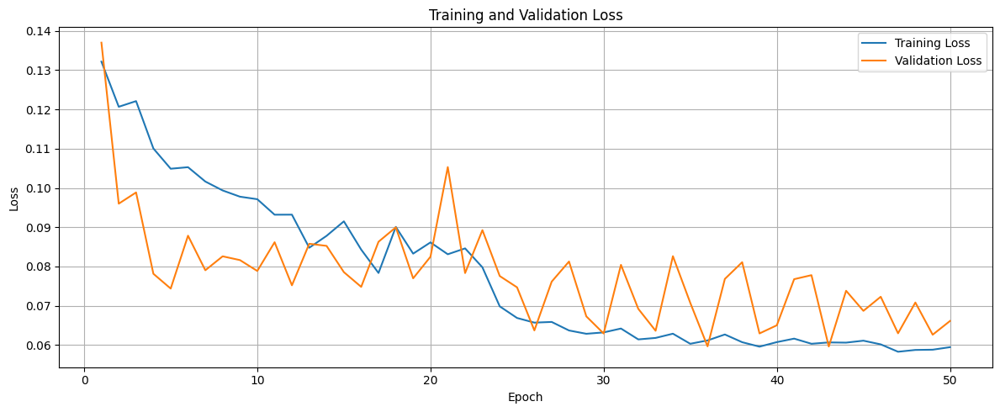

Model: "aod_LSTMSeq2SeqReduction_16_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 7, 20)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ (None, 7, 100)    │     48,400 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ [(None, 50),      │     30,200 │ lstm_10[0][0]     │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 16)        │        816 │ lstm_11[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_4     │ (None, 7, 16)     │          0 │ dense_8[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 7, 50)     │     13,400 │ repeat_vector_4[… │
│                     │                   │            │ lstm_11[0][1],    │
│                     │                   │            │ lstm_11[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_13 (LSTM)      │ (None, 7, 100)    │     60,400 │ lstm_12[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_7  │ (None, 7, 20)     │      2,020 │ lstm_13[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 465,710 (1.78 MB)

 Trainable params: 155,236 (606.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 310,474 (1.18 MB)

None


Model: "aod_LSTMSeq2SeqReduction_16_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 7, 20)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_10 (LSTM)                  │ (None, 7, 100)         │        48,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 16)             │           816 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,416 (310.22 KB)

 Trainable params: 79,416 (310.22 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "aod_LSTMPrediction_with_LSTMSeq2SeqReduction_16_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 24, 17)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_14 (LSTM)      │ [(None, 64),      │     20,992 │ input_layer_7[0]… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_5     │ (None, 24, 64)    │          0 │ lstm_14[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 24, 64)    │     33,024 │ repeat_vector_5[… │
│                     │                   │            │ lstm_14[0][1],    │
│                     │                   │            │ lstm_14[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 24, 64)    │          0 │ lstm_15[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_8  │ (None, 24, 32)    │      2,080 │ dropout_3[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_9  │ (None, 24, 1)     │         33 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 56,129 (219.25 KB)

 Trainable params: 56,129 (219.25 KB)

 Non-trainable params: 0 (0.00 B)

None


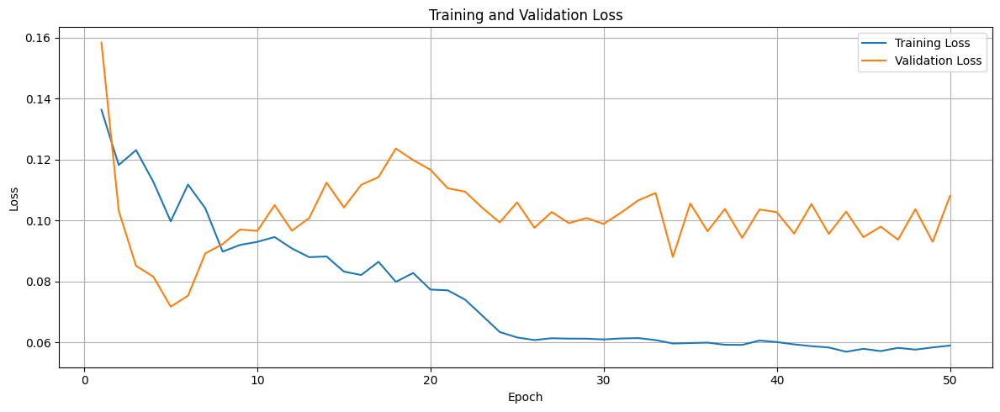

Model: "aod_LSTMSeq2SeqReduction_17_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 7, 20)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ (None, 7, 100)    │     48,400 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_17 (LSTM)      │ [(None, 50),      │     30,200 │ lstm_16[0][0]     │
│                     │ (None, 50),       │            │                   │
│                     │ (None, 50)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 17)        │        867 │ lstm_17[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_6     │ (None, 7, 17)     │          0 │ dense_12[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_18 (LSTM)      │ (None, 7, 50)     │     13,600 │ repeat_vector_6[… │
│                     │                   │            │ lstm_17[0][1],    │
│                     │                   │            │ lstm_17[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_19 (LSTM)      │ (None, 7, 100)    │     60,400 │ lstm_18[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_10 │ (None, 7, 20)     │      2,020 │ lstm_19[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 466,463 (1.78 MB)

 Trainable params: 155,487 (607.37 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 310,976 (1.19 MB)

None


Model: "aod_LSTMSeq2SeqReduction_17_features_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 7, 20)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 7, 100)         │        48,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ [(None, 50), (None,    │        30,200 │
│                                 │ 50), (None, 50)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 17)             │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,467 (310.42 KB)

 Trainable params: 79,467 (310.42 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "aod_LSTMPrediction_with_LSTMSeq2SeqReduction_17_features"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_10      │ (None, 24, 18)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_20 (LSTM)      │ [(None, 64),      │     21,248 │ input_layer_10[0… │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_7     │ (None, 24, 64)    │          0 │ lstm_20[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_21 (LSTM)      │ (None, 24, 64)    │     33,024 │ repeat_vector_7[… │
│                     │                   │            │ lstm_20[0][1],    │
│                     │                   │            │ lstm_20[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 24, 64)    │          0 │ lstm_21[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_11 │ (None, 24, 32)    │      2,080 │ dropout_4[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_12 │ (None, 24, 1)     │         33 │ time_distributed… │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 56,385 (220.25 KB)

 Trainable params: 56,385 (220.25 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION, LSTMSeq2SeqReduction, LSTMPrediction, X_aod_scaled, y_aod_scaled, aod_label_scaler)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["LSTM-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["Yes"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_lstms2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_lstms2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_lstms2s_reduced_2021_2022.csv"))
df_lstms2s_reduced

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_lstms2s_reduced_augmented = augmentReducedData(df_lstms2s_reduced, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_lstms2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_lstms2s_reduced_2021_2022_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_lstms2s_reduced_augmented

#### Doing the loop (no pm25_3km)

In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION_NO_PM25_3KM, LSTMSeq2SeqReduction, LSTMPrediction, X_aod_no_pm25_3km_scaled, y_aod_scaled, aod_label_scaler, False)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["LSTM-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["No"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data (no pm25_3km)

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_lstms2s_reduced_no_pm25_3km = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_lstms2s_reduced_no_pm25_3km.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_lstms2s_reduced_2021_2022_no_pm25_3km.csv"))
df_lstms2s_reduced_no_pm25_3km

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_lstms2s_reduced_augmented = augmentReducedData(df_lstms2s_reduced_no_pm25_3km, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_lstms2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_lstms2s_reduced_2021_2022_no_pm25_3km_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_lstms2s_reduced_augmented

### Prediction + GRU-Seq2Seq

#### Doing the loop

In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION, GRUSeq2SeqReduction, LSTMPrediction, X_aod_scaled, y_aod_scaled, aod_label_scaler)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["GRU-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["Yes"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_grus2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_grus2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_grus2s_reduced_2021_2022.csv"))
df_grus2s_reduced

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_grus2s_reduced_augmented = augmentReducedData(df_grus2s_reduced, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_grus2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_grus2s_reduced_2021_2022_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_grus2s_reduced_augmented

#### Doing the loop (no pm25_3km)

In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION_NO_PM25_3KM, GRUSeq2SeqReduction, LSTMPrediction, X_aod_no_pm25_3km_scaled, y_aod_scaled, aod_label_scaler, False)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["GRU-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["No"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data (no pm25_3km)

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_grus2s_reduced_no_pm25_3km = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_grus2s_reduced_no_pm25_3km.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_grus2s_reduced_2021_2022_no_pm25_3km.csv"))
df_grus2s_reduced_no_pm25_3km

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_grus2s_reduced_augmented = augmentReducedData(df_grus2s_reduced_no_pm25_3km, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_grus2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_grus2s_reduced_2021_2022_no_pm25_3km_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_grus2s_reduced_augmented

### Prediction + CNN-LSTM Seq2seq

#### Doing the loop

In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION, CNNLSTMSeq2SeqReduction, LSTMPrediction, X_aod_scaled, y_aod_scaled, aod_label_scaler)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["CNNLSTM-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["Yes"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_cnnlstms2s_reduced = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_cnnlstms2s_reduced.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_cnnlstms2s_reduced_2021_2022.csv"))
df_cnnlstms2s_reduced

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_cnnlstms2s_reduced_augmented = augmentReducedData(df_cnnlstms2s_reduced, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_cnnlstms2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_cnnlstms2s_reduced_2021_2022_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_cnnlstms2s_reduced_augmented

#### Doing the loop (no pm25_3km)

In [ ]:
loopresults = generate_loopresults(RANGE_OF_DIMENSION, CNNLSTMSeq2SeqReduction, LSTMPrediction, X_aod_no_pm25_3km_scaled, y_aod_scaled, aod_label_scaler, False)
best_mae, best_mse, best_r2, best_num_of_components, best_encoded_data, best_evaluation_data, best_encoder_model_path = choose_the_best(loopresults)

# Print out the evaluation board
evaluation_board['dim_reduction_method'] += ["CNNLSTM-Seq2Seq"]
evaluation_board['dim_after_reduction'] += [best_num_of_components]
evaluation_board['prediction'] += ["LSTM"]
evaluation_board['mae'] += [best_mae]
evaluation_board['mse'] += [best_mse]
evaluation_board['r2'] += [best_r2]
evaluation_board['with_pm25_3km'] += ["No"]
pd.DataFrame(evaluation_board)

#### Prepare reduced data (no pm25_3km)

In [ ]:
# Copy the best reduction model to target directory
shutil.copy(best_encoder_model_path, conf["workspace"]["best_reduction_models_dir"])

# Prepare the reduced data
df_cnnlstms2s_reduced_no_pm25_3km = prepareReducedData(best_encoded_data, aod_time_indices, aod_station_column)
df_cnnlstms2s_reduced_no_pm25_3km.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_cnnlstms2s_reduced_2021_2022_no_pm25_3km.csv"))
df_cnnlstms2s_reduced_no_pm25_3km

In [ ]:
# Prepare the reduced data with additional pm25_3km and predicted pm25 values
df_cnnlstms2s_reduced_augmented = augmentReducedData(df_cnnlstms2s_reduced_no_pm25_3km, y_aod_scaled, aod_pm25_3km_column, aod_label_scaler)
df_cnnlstms2s_reduced_augmented.to_csv(os.path.join(conf["workspace"]["best_reduced_data"], "df_cnnlstms2s_reduced_2021_2022_no_pm25_3km_with_raw_pm25_3km_and_prediced_pm25.csv"))
df_cnnlstms2s_reduced_augmented